**SegResNet, FedProx, ISLES'24, ISLES'22 Lightweight**

ISLES24 

CLIENT 1 (50)

VAL (49)
TEST(50)



ISLES22 

CLIENT 2(75), 3(75)

VAL (50)
TEST(50)


In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd, Spacingd, CropForegroundd, RandCropByPosNegLabeld
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric

from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = []
data_dir.append("D:/F25-156/Combined/ISLES24 Split 100 Preprocessed")
data_dir.append("D:/F25-156/Combined/ISLES22 Split 75 Preprocessed")

print(data_dir)

['D:/F25-156/Combined/ISLES24 Split 100 Preprocessed', 'D:/F25-156/Combined/ISLES22 Split 75 Preprocessed']


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/SegResNet/Federated_SegResNet_checkpoints"
log_dir = "D:/F25-156/SegResNet/Federated_SegResNet_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

# %load_ext tensorboard
# %tensorboard --logdir "D:/F25-156/SegResNet/Federated_SegResNet_logs"

Checkpoints will be saved to: D:/F25-156/SegResNet/Federated_SegResNet_checkpoints
TensorBoard logs will be saved to: D:/F25-156/SegResNet/Federated_SegResNet_logs


In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [7]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [8]:
# target_shape = (128, 128, 128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),

#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")
#     ),

#     # ⭐ Crop based on image, applied to both
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image",
#     ),

#     # ⭐ Make uniform shape
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape
#     ),

#     # Only normalize image
#     NormalizeIntensityd(keys=["image"], nonzero=True)
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [9]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [10]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**

Number of Clients  3

Client 0 (ISLES24)
D:/F25-156/Combined/ISLES24 Split 100\train\client_0
D:/F25-156/Combined/ISLES24 Split 100 Preprocessed\train\client_0
Original samples: 100 | Preprocessed samples: 100

🔵 RAW SAMPLES
Sample 81 | Image shape: (512, 609, 40) | Mask shape: (512, 609, 40)


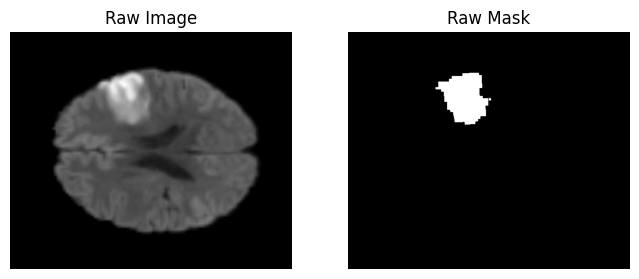

Sample 14 | Image shape: (512, 558, 65) | Mask shape: (512, 558, 65)


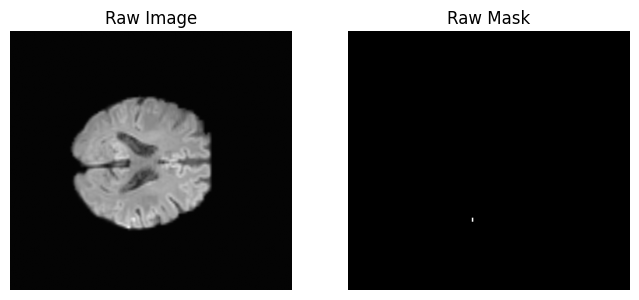


🟢 PREPROCESSED SAMPLES
Sample 81 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


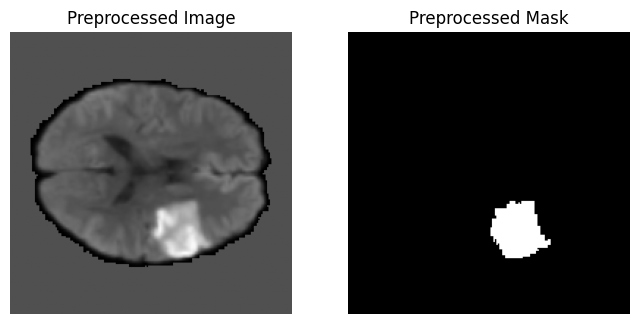

Sample 14 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


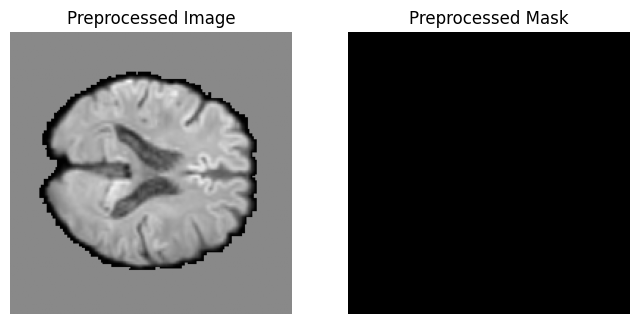


Dataset size: 100

Client 0 (ISLES22-75)
D:/F25-156/Combined/ISLES22 Split 75\train\client_0
D:/F25-156/Combined/ISLES22 Split 75 Preprocessed\train\client_0
Original samples: 75 | Preprocessed samples: 75

🔵 RAW SAMPLES
Sample 3 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72)


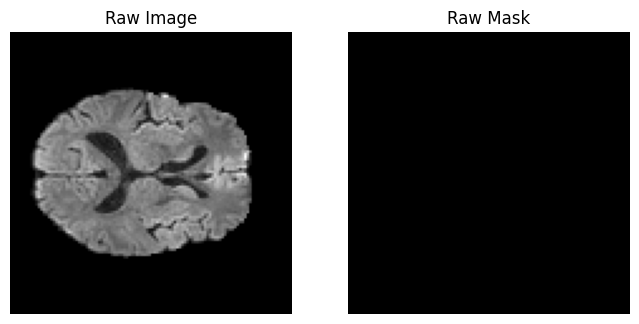

Sample 35 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73)


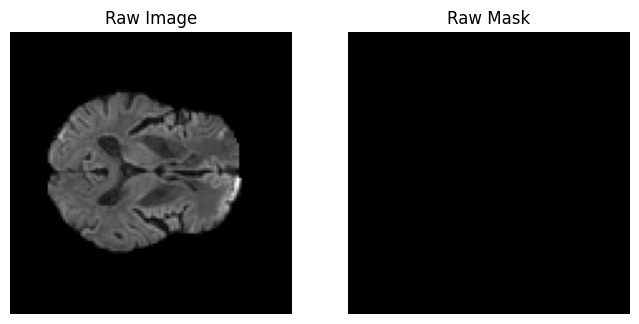


🟢 PREPROCESSED SAMPLES
Sample 3 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


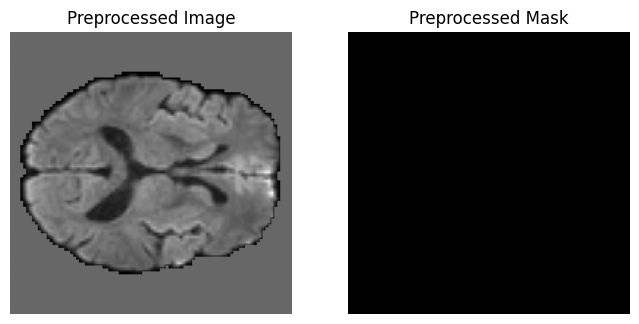

Sample 35 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


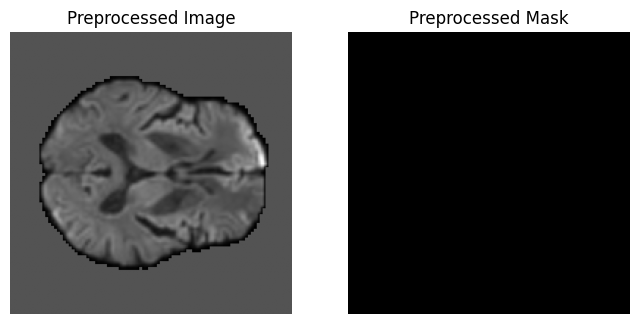


Dataset size: 75

Client 1 (ISLES22-75)
D:/F25-156/Combined/ISLES22 Split 75\train\client_1
D:/F25-156/Combined/ISLES22 Split 75 Preprocessed\train\client_1
Original samples: 75 | Preprocessed samples: 75

🔵 RAW SAMPLES
Sample 31 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73)


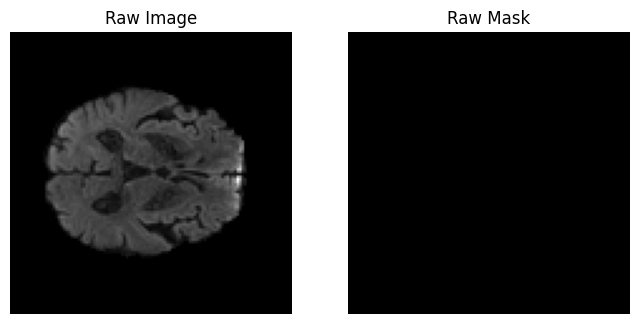

Sample 28 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73)


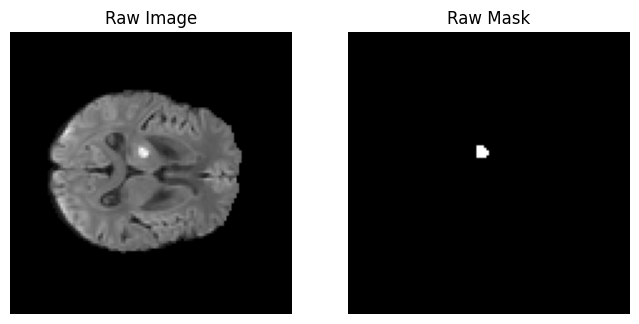


🟢 PREPROCESSED SAMPLES
Sample 31 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


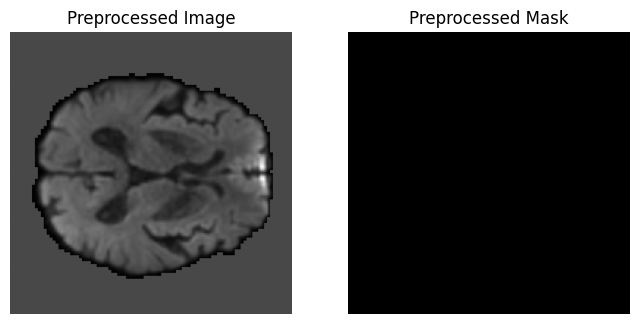

Sample 28 | Image shape: (192, 192, 192) | Mask shape: (192, 192, 192)


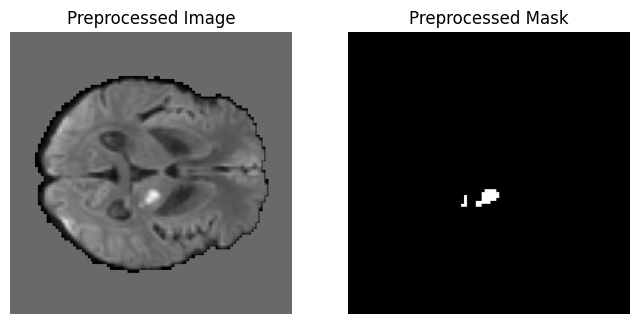


Dataset size: 75


In [11]:
clients = [
    {
        "name": "Client 0 (ISLES24)",
        "orig_root": "D:/F25-156/Combined/ISLES24 Split 100" ,
        "proc_root": "D:/F25-156/Combined/ISLES24 Split 100 Preprocessed",
        "client_id": 0,
        "split": "train",
    },
    {
        "name": "Client 0 (ISLES22-75)",
        "orig_root": "D:/F25-156/Combined/ISLES22 Split 75",
        "proc_root": "D:/F25-156/Combined/ISLES22 Split 75 Preprocessed",
        "client_id": 0,  
        "split": "train",
    },
    {
        "name": "Client 1 (ISLES22-75)",
        "orig_root": "D:/F25-156/Combined/ISLES22 Split 75",
        "proc_root": "D:/F25-156/Combined/ISLES22 Split 75 Preprocessed",
        "client_id": 1,   
        "split": "train",
    },
]
num_clients=len(clients)
print("Number of Clients ", num_clients)

client_datasets = []

for client in clients:

    print("\n" + "="*60)
    print(client["name"])
    print("="*60)

    # ORIGINAL
    orig_dir = os.path.join(
        client["orig_root"], "train", f"client_{client['client_id']}"
    )
    print(orig_dir)

    dwi_files, mask_files = load_dwi_mask_pairs(orig_dir)

    # PREPROCESSED
    proc_dir = os.path.join(
        client["proc_root"], "train", f"client_{client['client_id']}"
    )
    print(proc_dir)
    proc_dwi, proc_mask = load_dwi_mask_pairs(proc_dir)

    print(f"Original samples: {len(dwi_files)} | Preprocessed samples: {len(proc_dwi)}")

    # Random samples
    sample_indices = random.sample(range(len(dwi_files)), k=min(2, len(dwi_files)))

    # RAW VIS
    print("\n🔵 RAW SAMPLES")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape}")

        mid = img.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid], cmap="gray")
        plt.title("Raw Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid], cmap="gray")
        plt.title("Raw Mask")
        plt.axis("off")
        plt.show()

    # PREPROCESSED VIS
    print("\n🟢 PREPROCESSED SAMPLES")

    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:
        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}")

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nDataset size: {len(ds)}")

**Validation Set**

In [12]:
val_sets = {
    "ISLES22": "D:/F25-156/Combined/ISLES22 Split 75 Preprocessed/val",
    "ISLES24": "D:/F25-156/Combined/ISLES24 Split 100 Preprocessed/val",
}

val_loaders = {}

for name, path in val_sets.items():

    val_dwi, val_mask = load_dwi_mask_pairs(path)

    dataset = ISLESDataset(
        dwi_files=val_dwi,
        mask_files=val_mask,
        transform=transform,
    )

    loader = DataLoader(dataset, batch_size=1, shuffle=False)

    val_loaders[name] = loader

    print(f"{name} validation samples:", len(dataset))

ISLES22 validation samples: 50
ISLES24 validation samples: 24


In [13]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [14]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


## SegResNet

In [15]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

In [16]:
# Federated:
# Initial feature extractor
# Full encoder

# Personalized:
# Decoder
# Upsampling path
# Segmentation head

SHARED_LAYER_PREFIXES = [
    "convInit",
    "down_layers"
]

**Client Class**

In [17]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.dataset = dataset
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.mu = mu   # FedProx coefficient
        self.best_dice = 0.0

        # stores encoder params from server
        self.global_encoder_params = None

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        state = self.model.state_dict()
        return {
            k: v.cpu().clone()
            for k, v in state.items()
            if any(k.startswith(prefix) for prefix in SHARED_LAYER_PREFIXES)
        }

    def set_parameters(self, parameters):
        local_state = self.model.state_dict()

        for k, v in parameters.items():
            if k in local_state:
                local_state[k] = v.to(self.device)

        self.model.load_state_dict(local_state)

    def get_data_size(self):
        return len(self.dataset)
    
    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # store global encoder
        global_params = self.global_encoder_params
        
        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                # FedProx proximal term
                if global_params is not None:
                    prox_term = 0.0
                    for name, param in self.model.named_parameters():
                        if name in global_params:
                            prox_term += ((param - global_params[name]) ** 2).sum()

                    loss = loss + (self.mu / 2) * prox_term

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return {
            "state_dict": self.get_parameters(),
            "n_samples": self.get_data_size(),
            "loss": avg_loss,
            "dice": mean_dice,
            "iou": mean_iou,
            "hd95": mean_hd95,
        }
    
    def train_epochs_personalization(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return {
            "loss": avg_loss,
            "dice": mean_dice,
            "iou": mean_iou,
            "hd95": mean_hd95,
        }

**Server Class**

In [18]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params):
        # Start with the full existing global state (keeps decoder intact)
        global_state = self.global_model.state_dict()
        
        total_samples = sum(c["n_samples"] for c in client_params)

        for key in client_params[0]["params"].keys():
            param = client_params[0]["params"][key]

            if torch.is_floating_point(param):
                weighted_sum = torch.zeros_like(param)
                for client in client_params:
                    weight = client["n_samples"] / total_samples
                    weighted_sum += client["params"][key].to(param.device) * weight
                global_state[key] = weighted_sum  # only updates encoder keys
            else:
                global_state[key] = param.clone()

        # Now has all keys: aggregated encoder + existing decoder
        self.global_model.load_state_dict(global_state)

    def distribute(self, clients):
        shared_params = {
            k: v.cpu().clone()
            for k, v in self.global_model.state_dict().items()
            if any(k.startswith(prefix) for prefix in SHARED_LAYER_PREFIXES)
        }

        for client in clients:
            client.set_parameters(shared_params)

            # IMPORTANT FIX: pass encoder params for FedProx
            client.global_encoder_params = {
                k: v.clone().detach().to(client.device)
                for k, v in shared_params.items()
            }

    def validate(self):
        self.global_model.eval()

        results = {}

        for name, loader in self.val_loader.items():

            val_loss = 0
            self.dice_metric.reset()
            self.hd_metric.reset()

            with torch.no_grad():
                for batch in loader:
                    images = batch["image"].to(self.device, dtype=torch.float32)
                    masks = batch["mask"].to(self.device, dtype=torch.float32)

                    outputs = self.global_model(images)
                    loss = self.loss_fn(outputs, masks)
                    val_loss += loss.item()

                    pred_binary = (torch.sigmoid(outputs) > 0.5).float()

                    self.dice_metric(pred_binary, masks)

                    if masks.sum() > 0 and pred_binary.sum() > 0:
                        self.hd_metric(pred_binary, masks)

            avg_loss = val_loss / len(loader)
            mean_dice = self.dice_metric.aggregate().item()

            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')

            mean_iou = mean_dice / (2 - mean_dice)

            results[name] = {
                "loss": avg_loss,
                "dice": mean_dice,
                "iou": mean_iou,
                "hd95": mean_hd95,
            }

            print(f"\n{name} → Loss: {avg_loss:.4f} | Dice: {mean_dice:.4f} | IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

        # ---- model selection ----
        # use mean Dice across datasets
        avg_dice = sum(r["dice"] for r in results.values()) / len(results)

        if avg_dice > self.best_dice:
            self.best_dice = avg_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": avg_dice
            }, "best_global_model.pth")

            print(f"\n✅ Best global model updated (Mean Dice={avg_dice:.4f})")

        return results
    
    def validate_client_on_server(self, client):
        client.model.eval()

        results = {}

        for name, loader in self.val_loader.items():

            val_loss = 0
            self.dice_metric.reset()
            self.hd_metric.reset()

            with torch.no_grad():
                for batch in loader:
                    images = batch["image"].to(self.device, dtype=torch.float32)
                    masks = batch["mask"].to(self.device, dtype=torch.float32)

                    outputs = client.model(images)
                    loss = self.loss_fn(outputs, masks)
                    val_loss += loss.item()

                    pred_binary = (torch.sigmoid(outputs) > 0.5).float()

                    self.dice_metric(pred_binary, masks)

                    if masks.sum() > 0 and pred_binary.sum() > 0:
                        self.hd_metric(pred_binary, masks)

            avg_loss = val_loss / len(loader)
            mean_dice = self.dice_metric.aggregate().item()

            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')

            mean_iou = mean_dice / (2 - mean_dice)

            results[name] = {
                "loss": avg_loss,
                "dice": mean_dice,
                "iou": mean_iou,
                "hd95": mean_hd95,
            }

            print(f"\n{name} → Loss: {avg_loss:.4f} | Dice: {mean_dice:.4f} | IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

        # ---- model selection ----
        # use mean Dice across datasets
        avg_dice = sum(r["dice"] for r in results.values()) / len(results)

        if avg_dice > client.best_dice:
            client.best_dice = avg_dice
            torch.save(
                {
                    "client_id": client.id,
                    "model_state_dict": client.model.state_dict(),
                    "dice": mean_dice,
                    "iou": mean_iou,
                    "hd95": mean_hd95,
                    "loss": avg_loss,
                },
                f"best_client_{client.id}.pth"
            )

            print(
                f"Best validation model updated for Client {client.id} "
                f"with Dice={avg_dice:.4f}"
            )

        return results
    


In [19]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loaders, device=device) #val_loaders (2 val sets now)

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

**Federated Training loop**

In [20]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

# ---- Initial Distribution of global model ----
server.distribute(clients)

for round_num in range(1, communication_rounds + 1):

    print(f"\n\n-- Communication Round {round_num} ---")

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        client_update = client.train_epochs(local_epochs)
        train_loss=client_update["loss"]
        train_dice=client_update["dice"]
        train_iou=client_update["iou"]
        train_hd95=client_update["hd95"]

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)

        client_params.append({
            "params": client_update["state_dict"],
            "n_samples": client_update["n_samples"]
        })

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Distribute global encoder ----
    server.distribute(clients)

    # ---- Validation on client model ----
    client_metrics = []

    for client in clients:

        val_results = server.validate_client_on_server(client)

        # -----------------------------------
        # Print separate validation per set
        # -----------------------------------
        for val_name, metrics in val_results.items():

            print(
                f"Client {client.id} | {val_name} | "
                f"Loss={metrics['loss']:.4f} | "
                f"Dice={metrics['dice']:.4f} | "
                f"IoU={metrics['iou']:.4f} | "
                f"HD95={metrics['hd95']:.4f}"
            )

        # -----------------------------------
        # Compute mean validation across BOTH sets
        # -----------------------------------
        avg_loss = sum(v["loss"] for v in val_results.values()) / len(val_results)
        avg_dice = sum(v["dice"] for v in val_results.values()) / len(val_results)
        avg_iou  = sum(v["iou"] for v in val_results.values()) / len(val_results)

        valid_hd95 = [
            v["hd95"] for v in val_results.values()
            if not np.isnan(v["hd95"])
        ]

        avg_hd95 = (
            sum(valid_hd95) / len(valid_hd95)
            if len(valid_hd95) > 0
            else float("nan")
        )

        # Store averaged client validation
        client_metrics.append((avg_loss, avg_dice, avg_iou, avg_hd95))

        # -----------------------------------
        # Print client combined validation
        # -----------------------------------
        print(
            f"\nClient {client.id} Combined Validation | "
            f"Loss={avg_loss:.4f} | "
            f"Dice={avg_dice:.4f} | "
            f"IoU={avg_iou:.4f} | "
            f"HD95={avg_hd95:.4f}\n"
        )

    # ============================
    # GLOBAL COMBINED VALIDATION (all clients)
    # ============================

    val_loss = sum(x[0] for x in client_metrics) / len(client_metrics)
    val_dice = sum(x[1] for x in client_metrics) / len(client_metrics)
    val_iou  = sum(x[2] for x in client_metrics) / len(client_metrics)

    valid_hd95 = [x[3] for x in client_metrics if not np.isnan(x[3])]
    val_hd95 = (
        sum(valid_hd95) / len(valid_hd95)
        if len(valid_hd95) > 0
        else float("nan")
    )


    # Save global history
    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)


    # TensorBoard combined validation
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    # Print combined validation
    print(
        f"\n(Gloabl) Combined Validation | "
        f"Loss={val_loss:.4f} | Dice={val_dice:.4f} | "
        f"IoU={val_iou:.4f} | HD95={val_hd95:.4f}"
    )

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()



-- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7878 | Dice: 0.1544 | IoU: 0.0837 | HD95: 82.2058


Client 0 | Epoch 2/20 | Loss: 0.7693 | Dice: 0.2406 | IoU: 0.1368 | HD95: 82.9427


Client 0 | Epoch 3/20 | Loss: 0.7605 | Dice: 0.2652 | IoU: 0.1528 | HD95: 81.3873


Client 0 | Epoch 4/20 | Loss: 0.7540 | Dice: 0.2550 | IoU: 0.1461 | HD95: 81.0693


Client 0 | Epoch 5/20 | Loss: 0.7470 | Dice: 0.2660 | IoU: 0.1534 | HD95: 82.4833


Client 0 | Epoch 6/20 | Loss: 0.7403 | Dice: 0.2813 | IoU: 0.1637 | HD95: 81.8116


Client 0 | Epoch 7/20 | Loss: 0.7363 | Dice: 0.2935 | IoU: 0.1720 | HD95: 81.0808


Client 0 | Epoch 8/20 | Loss: 0.7270 | Dice: 0.2899 | IoU: 0.1695 | HD95: 79.7359


Client 0 | Epoch 9/20 | Loss: 0.7214 | Dice: 0.2900 | IoU: 0.1696 | HD95: 80.7374


Client 0 | Epoch 10/20 | Loss: 0.7158 | Dice: 0.2975 | IoU: 0.1748 | HD95: 77.6567


Client 0 | Epoch 11/20 | Loss: 0.7085 | Dice: 0.3058 | IoU: 0.1805 | HD95: 75.5948


Client 0 | Epoch 12/20 | Loss: 0.7040 | Dice: 0.2965 | IoU: 0.1741 | HD95: 74.3895


Client 0 | Epoch 13/20 | Loss: 0.6988 | Dice: 0.2843 | IoU: 0.1657 | HD95: 80.7244


Client 0 | Epoch 14/20 | Loss: 0.6883 | Dice: 0.3103 | IoU: 0.1837 | HD95: 71.1396


Client 0 | Epoch 15/20 | Loss: 0.6792 | Dice: 0.3380 | IoU: 0.2034 | HD95: 72.1742


Client 0 | Epoch 16/20 | Loss: 0.6737 | Dice: 0.3261 | IoU: 0.1948 | HD95: 70.7114


Client 0 | Epoch 17/20 | Loss: 0.6644 | Dice: 0.3399 | IoU: 0.2048 | HD95: 67.8717


Client 0 | Epoch 18/20 | Loss: 0.6546 | Dice: 0.3651 | IoU: 0.2233 | HD95: 66.3935


Client 0 | Epoch 19/20 | Loss: 0.6467 | Dice: 0.3560 | IoU: 0.2166 | HD95: 65.9031


Clients Training:  33%|███▎      | 1/3 [51:10<1:42:20, 3070.05s/it]

Client 0 | Epoch 20/20 | Loss: 0.6574 | Dice: 0.2899 | IoU: 0.1695 | HD95: 72.9516
Client 0 | Loss=0.7117 | Dice=0.2899 | IoU=0.1695 | HD95=72.9516


Client 1 | Epoch 1/20 | Loss: 0.8027 | Dice: 0.1700 | IoU: 0.0929 | HD95: 75.7298


Client 1 | Epoch 2/20 | Loss: 0.7838 | Dice: 0.2270 | IoU: 0.1280 | HD95: 69.3842


Client 1 | Epoch 3/20 | Loss: 0.7745 | Dice: 0.2536 | IoU: 0.1452 | HD95: 69.6413


Client 1 | Epoch 4/20 | Loss: 0.7675 | Dice: 0.2662 | IoU: 0.1535 | HD95: 69.3016


Client 1 | Epoch 5/20 | Loss: 0.7623 | Dice: 0.2558 | IoU: 0.1466 | HD95: 69.8296


Client 1 | Epoch 6/20 | Loss: 0.7560 | Dice: 0.2726 | IoU: 0.1578 | HD95: 69.4991


Client 1 | Epoch 7/20 | Loss: 0.7537 | Dice: 0.2639 | IoU: 0.1520 | HD95: 68.6916


Client 1 | Epoch 8/20 | Loss: 0.7474 | Dice: 0.2386 | IoU: 0.1354 | HD95: 70.5728


Client 1 | Epoch 9/20 | Loss: 0.7426 | Dice: 0.2482 | IoU: 0.1417 | HD95: 70.1491


Client 1 | Epoch 10/20 | Loss: 0.7368 | Dice: 0.2875 | IoU: 0.1679 | HD95: 69.8507


Client 1 | Epoch 11/20 | Loss: 0.7339 | Dice: 0.2714 | IoU: 0.1570 | HD95: 69.8667


Client 1 | Epoch 12/20 | Loss: 0.7284 | Dice: 0.2660 | IoU: 0.1534 | HD95: 70.0764


Client 1 | Epoch 13/20 | Loss: 0.7248 | Dice: 0.2854 | IoU: 0.1665 | HD95: 68.8700


Client 1 | Epoch 14/20 | Loss: 0.7199 | Dice: 0.2952 | IoU: 0.1732 | HD95: 67.8862


Client 1 | Epoch 15/20 | Loss: 0.7166 | Dice: 0.2819 | IoU: 0.1640 | HD95: 68.5892


Client 1 | Epoch 16/20 | Loss: 0.7146 | Dice: 0.2771 | IoU: 0.1609 | HD95: 69.9004


Client 1 | Epoch 17/20 | Loss: 0.7104 | Dice: 0.2754 | IoU: 0.1597 | HD95: 69.5949


Client 1 | Epoch 18/20 | Loss: 0.7054 | Dice: 0.2614 | IoU: 0.1504 | HD95: 67.9419


Client 1 | Epoch 19/20 | Loss: 0.7042 | Dice: 0.2465 | IoU: 0.1406 | HD95: 69.6206


Clients Training:  67%|██████▋   | 2/3 [1:28:02<42:45, 2565.51s/it]  

Client 1 | Epoch 20/20 | Loss: 0.6977 | Dice: 0.2650 | IoU: 0.1527 | HD95: 68.6841
Client 1 | Loss=0.7392 | Dice=0.2650 | IoU=0.1527 | HD95=68.6841


Client 2 | Epoch 1/20 | Loss: 0.8104 | Dice: 0.2036 | IoU: 0.1134 | HD95: 71.8951


Client 2 | Epoch 2/20 | Loss: 0.7901 | Dice: 0.2355 | IoU: 0.1334 | HD95: 69.0704


Client 2 | Epoch 3/20 | Loss: 0.7812 | Dice: 0.2809 | IoU: 0.1634 | HD95: 68.5566


Client 2 | Epoch 4/20 | Loss: 0.7743 | Dice: 0.3054 | IoU: 0.1802 | HD95: 67.4581


Client 2 | Epoch 5/20 | Loss: 0.7682 | Dice: 0.3155 | IoU: 0.1873 | HD95: 66.7591


Client 2 | Epoch 6/20 | Loss: 0.7629 | Dice: 0.3103 | IoU: 0.1836 | HD95: 67.4891


Client 2 | Epoch 7/20 | Loss: 0.7585 | Dice: 0.3107 | IoU: 0.1839 | HD95: 67.6302


Client 2 | Epoch 8/20 | Loss: 0.7518 | Dice: 0.3331 | IoU: 0.1998 | HD95: 65.0649


Client 2 | Epoch 9/20 | Loss: 0.7478 | Dice: 0.3279 | IoU: 0.1961 | HD95: 65.4461


Client 2 | Epoch 10/20 | Loss: 0.7435 | Dice: 0.3208 | IoU: 0.1910 | HD95: 67.3919


Client 2 | Epoch 11/20 | Loss: 0.7380 | Dice: 0.3381 | IoU: 0.2035 | HD95: 66.0856


Client 2 | Epoch 12/20 | Loss: 0.7345 | Dice: 0.3403 | IoU: 0.2050 | HD95: 66.7338


Client 2 | Epoch 13/20 | Loss: 0.7308 | Dice: 0.3055 | IoU: 0.1803 | HD95: 66.8337


Client 2 | Epoch 14/20 | Loss: 0.7239 | Dice: 0.3516 | IoU: 0.2133 | HD95: 65.1802


Client 2 | Epoch 15/20 | Loss: 0.7216 | Dice: 0.3376 | IoU: 0.2031 | HD95: 65.7731


Client 2 | Epoch 16/20 | Loss: 0.7170 | Dice: 0.3437 | IoU: 0.2075 | HD95: 65.4663


Client 2 | Epoch 17/20 | Loss: 0.7131 | Dice: 0.3466 | IoU: 0.2097 | HD95: 64.6863


Client 2 | Epoch 18/20 | Loss: 0.7136 | Dice: 0.3001 | IoU: 0.1765 | HD95: 66.4903


Client 2 | Epoch 19/20 | Loss: 0.7035 | Dice: 0.3434 | IoU: 0.2073 | HD95: 65.0920


Client 2 Epochs: 100%|██████████| 20/20 [37:30<00:00, 112.51s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.6998 | Dice: 0.3420 | IoU: 0.2063 | HD95: 64.0194
Client 2 | Loss=0.7442 | Dice=0.3420 | IoU=0.2063 | HD95=64.0194



ISLES22 → Loss: 0.6693 | Dice: 0.2150 | IoU: 0.1205 | HD95: 68.6110

ISLES24 → Loss: 0.6030 | Dice: 0.3836 | IoU: 0.2373 | HD95: 55.9186
Best validation model updated for Client 0 with Dice=0.2993
Client 0 | ISLES22 | Loss=0.6693 | Dice=0.2150 | IoU=0.1205 | HD95=68.6110
Client 0 | ISLES24 | Loss=0.6030 | Dice=0.3836 | IoU=0.2373 | HD95=55.9186

Client 0 Combined Validation | Loss=0.6362 | Dice=0.2993 | IoU=0.1789 | HD95=62.2648


ISLES22 → Loss: 0.7084 | Dice: 0.1781 | IoU: 0.0978 | HD95: 76.9155

ISLES24 → Loss: 0.6689 | Dice: 0.3235 | IoU: 0.1929 | HD95: 63.7397
Best validation model updated for Client 1 with Dice=0.2508
Client 1 | ISLES22 | Loss=0.7084 | Dice=0.1781 | IoU=0.0978 | HD95=76.9155
Client 1 | ISLES24 | Loss=0.6689 | Dice=0.3235 | IoU=0.1929 | HD95=63.7397

Client 1 Combined Validation | Loss=0.6886 | Dice=0.2508 | IoU=0.1454 | HD95=70.3276


ISLES22 → Loss: 0.7145 | Dice: 0.1886 | IoU: 0.1041 | HD95: 77.0249

ISLES24 → Loss: 0.6749 | Dice: 0.3412 | IoU: 0.2057 | HD95: 

Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6535 | Dice: 0.2872 | IoU: 0.1677 | HD95: 75.0791


Client 0 | Epoch 2/20 | Loss: 0.6480 | Dice: 0.2689 | IoU: 0.1553 | HD95: 76.4421


Client 0 | Epoch 3/20 | Loss: 0.6242 | Dice: 0.3546 | IoU: 0.2155 | HD95: 64.3093


Client 0 | Epoch 4/20 | Loss: 0.6182 | Dice: 0.3457 | IoU: 0.2089 | HD95: 69.3647


Client 0 | Epoch 5/20 | Loss: 0.5959 | Dice: 0.3832 | IoU: 0.2370 | HD95: 63.0149


Client 0 | Epoch 6/20 | Loss: 0.5804 | Dice: 0.4143 | IoU: 0.2613 | HD95: 63.5594


Client 0 | Epoch 7/20 | Loss: 0.5669 | Dice: 0.4238 | IoU: 0.2689 | HD95: 62.7957


Client 0 | Epoch 8/20 | Loss: 0.5646 | Dice: 0.3991 | IoU: 0.2493 | HD95: 58.1227


Client 0 | Epoch 9/20 | Loss: 0.5419 | Dice: 0.4415 | IoU: 0.2833 | HD95: 56.2079


Client 0 | Epoch 10/20 | Loss: 0.5310 | Dice: 0.4528 | IoU: 0.2927 | HD95: 53.7736


Client 0 | Epoch 11/20 | Loss: 0.5270 | Dice: 0.4524 | IoU: 0.2923 | HD95: 55.7801


Client 0 | Epoch 12/20 | Loss: 0.4979 | Dice: 0.4938 | IoU: 0.3278 | HD95: 49.5780


Client 0 | Epoch 13/20 | Loss: 0.4835 | Dice: 0.5095 | IoU: 0.3418 | HD95: 49.7881


Client 0 | Epoch 14/20 | Loss: 0.4727 | Dice: 0.5198 | IoU: 0.3512 | HD95: 46.6115


Client 0 | Epoch 15/20 | Loss: 0.4506 | Dice: 0.5564 | IoU: 0.3854 | HD95: 41.9840


Client 0 | Epoch 16/20 | Loss: 0.4422 | Dice: 0.5461 | IoU: 0.3756 | HD95: 45.3390


Client 0 | Epoch 17/20 | Loss: 0.4322 | Dice: 0.5477 | IoU: 0.3771 | HD95: 40.7614


Client 0 | Epoch 18/20 | Loss: 0.4180 | Dice: 0.5711 | IoU: 0.3997 | HD95: 38.7790


Client 0 | Epoch 19/20 | Loss: 0.3989 | Dice: 0.5948 | IoU: 0.4233 | HD95: 35.1902


Clients Training:  33%|███▎      | 1/3 [48:27<1:36:55, 2907.94s/it]

Client 0 | Epoch 20/20 | Loss: 0.3924 | Dice: 0.5970 | IoU: 0.4255 | HD95: 36.9703
Client 0 | Loss=0.5220 | Dice=0.5970 | IoU=0.4255 | HD95=36.9703


Client 1 | Epoch 1/20 | Loss: 0.6958 | Dice: 0.2556 | IoU: 0.1465 | HD95: 69.0532


Client 1 | Epoch 2/20 | Loss: 0.6950 | Dice: 0.2496 | IoU: 0.1426 | HD95: 69.4005


Client 1 | Epoch 3/20 | Loss: 0.6873 | Dice: 0.2520 | IoU: 0.1442 | HD95: 69.6537


Client 1 | Epoch 4/20 | Loss: 0.6809 | Dice: 0.2817 | IoU: 0.1639 | HD95: 68.8023


Client 1 | Epoch 5/20 | Loss: 0.6774 | Dice: 0.2791 | IoU: 0.1622 | HD95: 68.7820


Client 1 | Epoch 6/20 | Loss: 0.6730 | Dice: 0.2834 | IoU: 0.1651 | HD95: 68.8451


Client 1 | Epoch 7/20 | Loss: 0.6768 | Dice: 0.2422 | IoU: 0.1378 | HD95: 70.4991


Client 1 | Epoch 8/20 | Loss: 0.6654 | Dice: 0.2885 | IoU: 0.1686 | HD95: 69.7194


Client 1 | Epoch 9/20 | Loss: 0.6614 | Dice: 0.2896 | IoU: 0.1693 | HD95: 67.9450


Client 1 | Epoch 10/20 | Loss: 0.6595 | Dice: 0.2774 | IoU: 0.1611 | HD95: 68.9081


Client 1 | Epoch 11/20 | Loss: 0.6517 | Dice: 0.3057 | IoU: 0.1805 | HD95: 67.3159


Client 1 | Epoch 12/20 | Loss: 0.6471 | Dice: 0.3071 | IoU: 0.1814 | HD95: 67.2677


Client 1 | Epoch 13/20 | Loss: 0.6460 | Dice: 0.3257 | IoU: 0.1945 | HD95: 64.3546


Client 1 | Epoch 14/20 | Loss: 0.6375 | Dice: 0.3006 | IoU: 0.1769 | HD95: 67.5398


Client 1 | Epoch 15/20 | Loss: 0.6325 | Dice: 0.3336 | IoU: 0.2002 | HD95: 65.8529


Client 1 | Epoch 16/20 | Loss: 0.6249 | Dice: 0.3582 | IoU: 0.2182 | HD95: 64.2057


Client 1 | Epoch 17/20 | Loss: 0.6242 | Dice: 0.3184 | IoU: 0.1893 | HD95: 66.0273


Client 1 | Epoch 18/20 | Loss: 0.6198 | Dice: 0.3292 | IoU: 0.1970 | HD95: 63.8720


Client 1 | Epoch 19/20 | Loss: 0.6084 | Dice: 0.3636 | IoU: 0.2222 | HD95: 62.1633


Clients Training:  67%|██████▋   | 2/3 [1:25:19<41:38, 2498.48s/it]  

Client 1 | Epoch 20/20 | Loss: 0.6016 | Dice: 0.3892 | IoU: 0.2416 | HD95: 60.5555
Client 1 | Loss=0.6533 | Dice=0.3892 | IoU=0.2416 | HD95=60.5555


Client 2 | Epoch 1/20 | Loss: 0.6985 | Dice: 0.3028 | IoU: 0.1784 | HD95: 66.4179


Client 2 | Epoch 2/20 | Loss: 0.6926 | Dice: 0.3171 | IoU: 0.1884 | HD95: 65.2434


Client 2 | Epoch 3/20 | Loss: 0.6854 | Dice: 0.3560 | IoU: 0.2166 | HD95: 62.5065


Client 2 | Epoch 4/20 | Loss: 0.6830 | Dice: 0.3513 | IoU: 0.2131 | HD95: 61.8201


Client 2 | Epoch 5/20 | Loss: 0.6781 | Dice: 0.3374 | IoU: 0.2029 | HD95: 64.3909


Client 2 | Epoch 6/20 | Loss: 0.6730 | Dice: 0.3560 | IoU: 0.2165 | HD95: 62.3812


Client 2 | Epoch 7/20 | Loss: 0.6663 | Dice: 0.3653 | IoU: 0.2234 | HD95: 61.3354


Client 2 | Epoch 8/20 | Loss: 0.6645 | Dice: 0.3704 | IoU: 0.2273 | HD95: 62.3807


Client 2 | Epoch 9/20 | Loss: 0.6580 | Dice: 0.3725 | IoU: 0.2289 | HD95: 62.8010


Client 2 | Epoch 10/20 | Loss: 0.6492 | Dice: 0.4012 | IoU: 0.2509 | HD95: 59.8188


Client 2 | Epoch 11/20 | Loss: 0.6438 | Dice: 0.3979 | IoU: 0.2484 | HD95: 60.6422


Client 2 | Epoch 12/20 | Loss: 0.6376 | Dice: 0.4152 | IoU: 0.2620 | HD95: 59.1944


Client 2 | Epoch 13/20 | Loss: 0.6336 | Dice: 0.4174 | IoU: 0.2637 | HD95: 58.0815


Client 2 | Epoch 14/20 | Loss: 0.6258 | Dice: 0.4155 | IoU: 0.2622 | HD95: 54.8969


Client 2 | Epoch 15/20 | Loss: 0.6197 | Dice: 0.4233 | IoU: 0.2685 | HD95: 57.5775


Client 2 | Epoch 16/20 | Loss: 0.6103 | Dice: 0.4459 | IoU: 0.2869 | HD95: 57.1210


Client 2 | Epoch 17/20 | Loss: 0.6049 | Dice: 0.4256 | IoU: 0.2703 | HD95: 54.1169


Client 2 | Epoch 18/20 | Loss: 0.6052 | Dice: 0.4019 | IoU: 0.2515 | HD95: 61.6003


Client 2 | Epoch 19/20 | Loss: 0.5897 | Dice: 0.4580 | IoU: 0.2970 | HD95: 53.0122


Client 2 Epochs: 100%|██████████| 20/20 [37:05<00:00, 111.27s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.5755 | Dice: 0.4818 | IoU: 0.3174 | HD95: 50.6312
Client 2 | Loss=0.6447 | Dice=0.4818 | IoU=0.3174 | HD95=50.6312



ISLES22 → Loss: 0.5202 | Dice: 0.3094 | IoU: 0.1830 | HD95: 64.8464

ISLES24 → Loss: 0.4059 | Dice: 0.4823 | IoU: 0.3178 | HD95: 46.5249
Best validation model updated for Client 0 with Dice=0.3959
Client 0 | ISLES22 | Loss=0.5202 | Dice=0.3094 | IoU=0.1830 | HD95=64.8464
Client 0 | ISLES24 | Loss=0.4059 | Dice=0.4823 | IoU=0.3178 | HD95=46.5249

Client 0 Combined Validation | Loss=0.4631 | Dice=0.3959 | IoU=0.2504 | HD95=55.6857


ISLES22 → Loss: 0.6273 | Dice: 0.2801 | IoU: 0.1629 | HD95: 70.3751

ISLES24 → Loss: 0.5448 | Dice: 0.4027 | IoU: 0.2521 | HD95: 57.5210
Best validation model updated for Client 1 with Dice=0.3414
Client 1 | ISLES22 | Loss=0.6273 | Dice=0.2801 | IoU=0.1629 | HD95=70.3751
Client 1 | ISLES24 | Loss=0.5448 | Dice=0.4027 | IoU=0.2521 | HD95=57.5210

Client 1 Combined Validation | Loss=0.5860 | Dice=0.3414 | IoU=0.2075 | HD95=63.9480


ISLES22 → Loss: 0.6299 | Dice: 0.2503 | IoU: 0.1430 | HD95: 73.0732

ISLES24 → Loss: 0.5325 | Dice: 0.4133 | IoU: 0.2605 | HD95: 

Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5579 | Dice: 0.3063 | IoU: 0.1808 | HD95: 56.6063


Client 0 | Epoch 2/20 | Loss: 0.4408 | Dice: 0.4989 | IoU: 0.3324 | HD95: 48.2493


Client 0 | Epoch 3/20 | Loss: 0.4076 | Dice: 0.5338 | IoU: 0.3641 | HD95: 42.4121


Client 0 | Epoch 4/20 | Loss: 0.3848 | Dice: 0.5613 | IoU: 0.3901 | HD95: 36.8797


Client 0 | Epoch 5/20 | Loss: 0.4250 | Dice: 0.5109 | IoU: 0.3431 | HD95: 46.4585


Client 0 | Epoch 6/20 | Loss: 0.3659 | Dice: 0.5926 | IoU: 0.4211 | HD95: 34.1738


Client 0 | Epoch 7/20 | Loss: 0.3531 | Dice: 0.6040 | IoU: 0.4327 | HD95: 31.9990


Client 0 | Epoch 8/20 | Loss: 0.3494 | Dice: 0.6007 | IoU: 0.4293 | HD95: 32.4037


Client 0 | Epoch 9/20 | Loss: 0.3487 | Dice: 0.5970 | IoU: 0.4256 | HD95: 32.5439


Client 0 | Epoch 10/20 | Loss: 0.3383 | Dice: 0.6144 | IoU: 0.4435 | HD95: 32.2787


Client 0 | Epoch 11/20 | Loss: 0.3279 | Dice: 0.6209 | IoU: 0.4503 | HD95: 31.5316


Client 0 | Epoch 12/20 | Loss: 0.3214 | Dice: 0.6253 | IoU: 0.4548 | HD95: 27.7594


Client 0 | Epoch 13/20 | Loss: 0.3174 | Dice: 0.6249 | IoU: 0.4545 | HD95: 28.1159


Client 0 | Epoch 14/20 | Loss: 0.3211 | Dice: 0.6246 | IoU: 0.4541 | HD95: 27.9196


Client 0 | Epoch 15/20 | Loss: 0.3063 | Dice: 0.6396 | IoU: 0.4702 | HD95: 29.5452


Client 0 | Epoch 16/20 | Loss: 0.3060 | Dice: 0.6416 | IoU: 0.4723 | HD95: 27.0438


Client 0 | Epoch 17/20 | Loss: 0.3037 | Dice: 0.6385 | IoU: 0.4689 | HD95: 24.2615


Client 0 | Epoch 18/20 | Loss: 0.2981 | Dice: 0.6474 | IoU: 0.4786 | HD95: 26.5456


Client 0 | Epoch 19/20 | Loss: 0.2910 | Dice: 0.6576 | IoU: 0.4899 | HD95: 25.8600


Clients Training:  33%|███▎      | 1/3 [45:50<1:31:40, 2750.22s/it]

Client 0 | Epoch 20/20 | Loss: 0.2846 | Dice: 0.6685 | IoU: 0.5021 | HD95: 25.3828
Client 0 | Loss=0.3525 | Dice=0.6685 | IoU=0.5021 | HD95=25.3828


Client 1 | Epoch 1/20 | Loss: 0.6128 | Dice: 0.3118 | IoU: 0.1847 | HD95: 64.5528


Client 1 | Epoch 2/20 | Loss: 0.5971 | Dice: 0.3495 | IoU: 0.2118 | HD95: 63.4046


Client 1 | Epoch 3/20 | Loss: 0.5851 | Dice: 0.3950 | IoU: 0.2461 | HD95: 60.9250


Client 1 | Epoch 4/20 | Loss: 0.5774 | Dice: 0.4231 | IoU: 0.2683 | HD95: 57.4013


Client 1 | Epoch 5/20 | Loss: 0.5687 | Dice: 0.4299 | IoU: 0.2738 | HD95: 56.4211


Client 1 | Epoch 6/20 | Loss: 0.5570 | Dice: 0.4445 | IoU: 0.2858 | HD95: 55.5526


Client 1 | Epoch 7/20 | Loss: 0.5662 | Dice: 0.3928 | IoU: 0.2444 | HD95: 62.3262


Client 1 | Epoch 8/20 | Loss: 0.5532 | Dice: 0.4262 | IoU: 0.2708 | HD95: 55.2454


Client 1 | Epoch 9/20 | Loss: 0.5349 | Dice: 0.4690 | IoU: 0.3063 | HD95: 51.8093


Client 1 | Epoch 10/20 | Loss: 0.5220 | Dice: 0.4925 | IoU: 0.3267 | HD95: 48.0089


Client 1 | Epoch 11/20 | Loss: 0.5196 | Dice: 0.4714 | IoU: 0.3084 | HD95: 49.6387


Client 1 | Epoch 12/20 | Loss: 0.5107 | Dice: 0.4880 | IoU: 0.3227 | HD95: 50.2455


Client 1 | Epoch 13/20 | Loss: 0.5032 | Dice: 0.4920 | IoU: 0.3263 | HD95: 45.9568


Client 1 | Epoch 14/20 | Loss: 0.5052 | Dice: 0.4751 | IoU: 0.3116 | HD95: 51.8833


Client 1 | Epoch 15/20 | Loss: 0.4769 | Dice: 0.5507 | IoU: 0.3800 | HD95: 46.6955


Client 1 | Epoch 16/20 | Loss: 0.4609 | Dice: 0.5554 | IoU: 0.3845 | HD95: 39.9497


Client 1 | Epoch 17/20 | Loss: 0.4534 | Dice: 0.5610 | IoU: 0.3899 | HD95: 36.5425


Client 1 | Epoch 18/20 | Loss: 0.4555 | Dice: 0.5447 | IoU: 0.3743 | HD95: 45.3979


Client 1 | Epoch 19/20 | Loss: 0.4348 | Dice: 0.5765 | IoU: 0.4050 | HD95: 33.9290


Clients Training:  67%|██████▋   | 2/3 [1:21:05<39:36, 2376.54s/it]  

Client 1 | Epoch 20/20 | Loss: 0.4262 | Dice: 0.5769 | IoU: 0.4054 | HD95: 37.1909
Client 1 | Loss=0.5210 | Dice=0.5769 | IoU=0.4054 | HD95=37.1909


Client 2 | Epoch 1/20 | Loss: 0.5798 | Dice: 0.4267 | IoU: 0.2712 | HD95: 58.4907


Client 2 | Epoch 2/20 | Loss: 0.5620 | Dice: 0.4728 | IoU: 0.3096 | HD95: 51.8652


Client 2 | Epoch 3/20 | Loss: 0.5525 | Dice: 0.4717 | IoU: 0.3087 | HD95: 53.7496


Client 2 | Epoch 4/20 | Loss: 0.5387 | Dice: 0.5071 | IoU: 0.3396 | HD95: 47.8970


Client 2 | Epoch 5/20 | Loss: 0.5437 | Dice: 0.4651 | IoU: 0.3030 | HD95: 53.8032


Client 2 | Epoch 6/20 | Loss: 0.5333 | Dice: 0.4827 | IoU: 0.3181 | HD95: 51.7230


Client 2 | Epoch 7/20 | Loss: 0.5199 | Dice: 0.4959 | IoU: 0.3297 | HD95: 50.8168


Client 2 | Epoch 8/20 | Loss: 0.4989 | Dice: 0.5253 | IoU: 0.3562 | HD95: 42.4483


Client 2 | Epoch 9/20 | Loss: 0.4829 | Dice: 0.5498 | IoU: 0.3791 | HD95: 44.3602


Client 2 | Epoch 10/20 | Loss: 0.4789 | Dice: 0.5344 | IoU: 0.3646 | HD95: 42.4803


Client 2 | Epoch 11/20 | Loss: 0.4622 | Dice: 0.5591 | IoU: 0.3880 | HD95: 41.5228


Client 2 | Epoch 12/20 | Loss: 0.4578 | Dice: 0.5603 | IoU: 0.3892 | HD95: 40.2968


Client 2 | Epoch 13/20 | Loss: 0.4408 | Dice: 0.5736 | IoU: 0.4022 | HD95: 39.5778


Client 2 | Epoch 14/20 | Loss: 0.4370 | Dice: 0.5749 | IoU: 0.4034 | HD95: 39.0245


Client 2 | Epoch 15/20 | Loss: 0.4219 | Dice: 0.5839 | IoU: 0.4124 | HD95: 38.7438


Client 2 | Epoch 16/20 | Loss: 0.4241 | Dice: 0.5647 | IoU: 0.3935 | HD95: 36.5497


Client 2 | Epoch 17/20 | Loss: 0.4158 | Dice: 0.5758 | IoU: 0.4043 | HD95: 39.3750


Client 2 | Epoch 18/20 | Loss: 0.4097 | Dice: 0.5754 | IoU: 0.4039 | HD95: 39.0208


Client 2 | Epoch 19/20 | Loss: 0.3917 | Dice: 0.6076 | IoU: 0.4364 | HD95: 34.8735


Client 2 Epochs: 100%|██████████| 20/20 [35:45<00:00, 107.28s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.3847 | Dice: 0.6080 | IoU: 0.4368 | HD95: 35.1944
Client 2 | Loss=0.4768 | Dice=0.6080 | IoU=0.4368 | HD95=35.1944



ISLES22 → Loss: 0.4650 | Dice: 0.3599 | IoU: 0.2194 | HD95: 66.7353

ISLES24 → Loss: 0.3982 | Dice: 0.4599 | IoU: 0.2986 | HD95: 36.9363
Best validation model updated for Client 0 with Dice=0.4099
Client 0 | ISLES22 | Loss=0.4650 | Dice=0.3599 | IoU=0.2194 | HD95=66.7353
Client 0 | ISLES24 | Loss=0.3982 | Dice=0.4599 | IoU=0.2986 | HD95=36.9363

Client 0 Combined Validation | Loss=0.4316 | Dice=0.4099 | IoU=0.2590 | HD95=51.8358


ISLES22 → Loss: 0.4689 | Dice: 0.4214 | IoU: 0.2669 | HD95: 55.6063

ISLES24 → Loss: 0.3800 | Dice: 0.5208 | IoU: 0.3521 | HD95: 52.7546
Best validation model updated for Client 1 with Dice=0.4711
Client 1 | ISLES22 | Loss=0.4689 | Dice=0.4214 | IoU=0.2669 | HD95=55.6063
Client 1 | ISLES24 | Loss=0.3800 | Dice=0.5208 | IoU=0.3521 | HD95=52.7546

Client 1 Combined Validation | Loss=0.4245 | Dice=0.4711 | IoU=0.3095 | HD95=54.1804


ISLES22 → Loss: 0.4674 | Dice: 0.4332 | IoU: 0.2765 | HD95: 48.6962

ISLES24 → Loss: 0.3579 | Dice: 0.5685 | IoU: 0.3972 | HD95: 

Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3504 | Dice: 0.5589 | IoU: 0.3878 | HD95: 34.9423


Client 0 | Epoch 2/20 | Loss: 0.3113 | Dice: 0.6147 | IoU: 0.4437 | HD95: 30.6457


Client 0 | Epoch 3/20 | Loss: 0.2967 | Dice: 0.6323 | IoU: 0.4623 | HD95: 29.6816


Client 0 | Epoch 4/20 | Loss: 0.3083 | Dice: 0.6114 | IoU: 0.4403 | HD95: 25.6211


Client 0 | Epoch 5/20 | Loss: 0.2893 | Dice: 0.6415 | IoU: 0.4722 | HD95: 29.6295


Client 0 | Epoch 6/20 | Loss: 0.2857 | Dice: 0.6443 | IoU: 0.4753 | HD95: 25.7044


Client 0 | Epoch 7/20 | Loss: 0.2936 | Dice: 0.6339 | IoU: 0.4641 | HD95: 27.4422


Client 0 | Epoch 8/20 | Loss: 0.2772 | Dice: 0.6558 | IoU: 0.4879 | HD95: 27.0425


Client 0 | Epoch 9/20 | Loss: 0.2768 | Dice: 0.6562 | IoU: 0.4883 | HD95: 24.4350


Client 0 | Epoch 10/20 | Loss: 0.2816 | Dice: 0.6492 | IoU: 0.4806 | HD95: 25.3867


Client 0 | Epoch 11/20 | Loss: 0.2746 | Dice: 0.6614 | IoU: 0.4941 | HD95: 24.5307


Client 0 | Epoch 12/20 | Loss: 0.2626 | Dice: 0.6775 | IoU: 0.5123 | HD95: 22.5459


Client 0 | Epoch 13/20 | Loss: 0.2685 | Dice: 0.6692 | IoU: 0.5029 | HD95: 22.9121


Client 0 | Epoch 14/20 | Loss: 0.2689 | Dice: 0.6685 | IoU: 0.5020 | HD95: 25.3611


Client 0 | Epoch 15/20 | Loss: 0.2641 | Dice: 0.6736 | IoU: 0.5078 | HD95: 21.9422


Client 0 | Epoch 16/20 | Loss: 0.2524 | Dice: 0.6877 | IoU: 0.5241 | HD95: 20.1341


Client 0 | Epoch 17/20 | Loss: 0.2844 | Dice: 0.6479 | IoU: 0.4791 | HD95: 24.3611


Client 0 | Epoch 18/20 | Loss: 0.2637 | Dice: 0.6755 | IoU: 0.5101 | HD95: 22.2012


Client 0 | Epoch 19/20 | Loss: 0.2585 | Dice: 0.6819 | IoU: 0.5174 | HD95: 21.0516


Clients Training:  33%|███▎      | 1/3 [45:15<1:30:30, 2715.06s/it]

Client 0 | Epoch 20/20 | Loss: 0.2616 | Dice: 0.6760 | IoU: 0.5106 | HD95: 24.8672
Client 0 | Loss=0.2815 | Dice=0.6760 | IoU=0.5106 | HD95=24.8672


Client 1 | Epoch 1/20 | Loss: 0.4557 | Dice: 0.5037 | IoU: 0.3367 | HD95: 46.9489


Client 1 | Epoch 2/20 | Loss: 0.4471 | Dice: 0.5206 | IoU: 0.3519 | HD95: 43.4396


Client 1 | Epoch 3/20 | Loss: 0.4637 | Dice: 0.4567 | IoU: 0.2959 | HD95: 52.0103


Client 1 | Epoch 4/20 | Loss: 0.4126 | Dice: 0.5534 | IoU: 0.3825 | HD95: 35.8111


Client 1 | Epoch 5/20 | Loss: 0.3910 | Dice: 0.5912 | IoU: 0.4197 | HD95: 33.5936


Client 1 | Epoch 6/20 | Loss: 0.3707 | Dice: 0.6164 | IoU: 0.4455 | HD95: 30.9095


Client 1 | Epoch 7/20 | Loss: 0.3797 | Dice: 0.5929 | IoU: 0.4214 | HD95: 36.2971


Client 1 | Epoch 8/20 | Loss: 0.3715 | Dice: 0.6119 | IoU: 0.4409 | HD95: 32.3903


Client 1 | Epoch 9/20 | Loss: 0.3619 | Dice: 0.6069 | IoU: 0.4356 | HD95: 33.5572


Client 1 | Epoch 10/20 | Loss: 0.3385 | Dice: 0.6493 | IoU: 0.4807 | HD95: 27.0557


Client 1 | Epoch 11/20 | Loss: 0.3330 | Dice: 0.6516 | IoU: 0.4832 | HD95: 27.7928


Client 1 | Epoch 12/20 | Loss: 0.3552 | Dice: 0.6025 | IoU: 0.4311 | HD95: 34.5824


Client 1 | Epoch 13/20 | Loss: 0.3584 | Dice: 0.6022 | IoU: 0.4308 | HD95: 33.3562


Client 1 | Epoch 14/20 | Loss: 0.3187 | Dice: 0.6829 | IoU: 0.5184 | HD95: 23.2917


Client 1 | Epoch 15/20 | Loss: 0.3007 | Dice: 0.6886 | IoU: 0.5251 | HD95: 23.5045


Client 1 | Epoch 16/20 | Loss: 0.2938 | Dice: 0.6916 | IoU: 0.5286 | HD95: 20.3738


Client 1 | Epoch 17/20 | Loss: 0.2956 | Dice: 0.6801 | IoU: 0.5153 | HD95: 26.5946


Client 1 | Epoch 18/20 | Loss: 0.3025 | Dice: 0.6694 | IoU: 0.5030 | HD95: 28.8919


Client 1 | Epoch 19/20 | Loss: 0.2923 | Dice: 0.6801 | IoU: 0.5153 | HD95: 26.5761


Clients Training:  67%|██████▋   | 2/3 [1:19:07<38:33, 2313.67s/it]  

Client 1 | Epoch 20/20 | Loss: 0.3032 | Dice: 0.6660 | IoU: 0.4993 | HD95: 24.4318
Client 1 | Loss=0.3573 | Dice=0.6660 | IoU=0.4993 | HD95=24.4318


Client 2 | Epoch 1/20 | Loss: 0.3919 | Dice: 0.5673 | IoU: 0.3959 | HD95: 38.1132


Client 2 | Epoch 2/20 | Loss: 0.3885 | Dice: 0.5745 | IoU: 0.4030 | HD95: 37.7225


Client 2 | Epoch 3/20 | Loss: 0.3532 | Dice: 0.6182 | IoU: 0.4473 | HD95: 29.9421


Client 2 | Epoch 4/20 | Loss: 0.3411 | Dice: 0.6404 | IoU: 0.4711 | HD95: 30.4437


Client 2 | Epoch 5/20 | Loss: 0.3384 | Dice: 0.6380 | IoU: 0.4684 | HD95: 27.6964


Client 2 | Epoch 6/20 | Loss: 0.3299 | Dice: 0.6510 | IoU: 0.4826 | HD95: 27.4631


Client 2 | Epoch 7/20 | Loss: 0.3206 | Dice: 0.6654 | IoU: 0.4986 | HD95: 24.9173


Client 2 | Epoch 8/20 | Loss: 0.3410 | Dice: 0.6172 | IoU: 0.4463 | HD95: 30.8989


Client 2 | Epoch 9/20 | Loss: 0.3323 | Dice: 0.6430 | IoU: 0.4738 | HD95: 29.0105


Client 2 | Epoch 10/20 | Loss: 0.3307 | Dice: 0.6272 | IoU: 0.4569 | HD95: 27.0770


Client 2 | Epoch 11/20 | Loss: 0.3193 | Dice: 0.6515 | IoU: 0.4832 | HD95: 27.6146


Client 2 | Epoch 12/20 | Loss: 0.2999 | Dice: 0.6654 | IoU: 0.4985 | HD95: 24.4619


Client 2 | Epoch 13/20 | Loss: 0.3183 | Dice: 0.6403 | IoU: 0.4709 | HD95: 26.9582


Client 2 | Epoch 14/20 | Loss: 0.2986 | Dice: 0.6703 | IoU: 0.5041 | HD95: 25.7112


Client 2 | Epoch 15/20 | Loss: 0.3130 | Dice: 0.6352 | IoU: 0.4655 | HD95: 28.4584


Client 2 | Epoch 16/20 | Loss: 0.2864 | Dice: 0.6851 | IoU: 0.5210 | HD95: 21.4590


Client 2 | Epoch 17/20 | Loss: 0.2739 | Dice: 0.6961 | IoU: 0.5339 | HD95: 23.5302


Client 2 | Epoch 18/20 | Loss: 0.2730 | Dice: 0.6938 | IoU: 0.5312 | HD95: 19.8792


Client 2 | Epoch 19/20 | Loss: 0.2710 | Dice: 0.6916 | IoU: 0.5286 | HD95: 26.1529


Client 2 Epochs: 100%|██████████| 20/20 [34:25<00:00, 103.29s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.2688 | Dice: 0.7016 | IoU: 0.5403 | HD95: 24.6530
Client 2 | Loss=0.3195 | Dice=0.7016 | IoU=0.5403 | HD95=24.6530



ISLES22 → Loss: 0.4881 | Dice: 0.3195 | IoU: 0.1901 | HD95: 67.9479

ISLES24 → Loss: 0.4250 | Dice: 0.4163 | IoU: 0.2628 | HD95: 35.9386
Client 0 | ISLES22 | Loss=0.4881 | Dice=0.3195 | IoU=0.1901 | HD95=67.9479
Client 0 | ISLES24 | Loss=0.4250 | Dice=0.4163 | IoU=0.2628 | HD95=35.9386

Client 0 Combined Validation | Loss=0.4566 | Dice=0.3679 | IoU=0.2265 | HD95=51.9432


ISLES22 → Loss: 0.3004 | Dice: 0.6359 | IoU: 0.4661 | HD95: 33.1048

ISLES24 → Loss: 0.2986 | Dice: 0.5982 | IoU: 0.4267 | HD95: 33.8211
Best validation model updated for Client 1 with Dice=0.6170
Client 1 | ISLES22 | Loss=0.3004 | Dice=0.6359 | IoU=0.4661 | HD95=33.1048
Client 1 | ISLES24 | Loss=0.2986 | Dice=0.5982 | IoU=0.4267 | HD95=33.8211

Client 1 Combined Validation | Loss=0.2995 | Dice=0.6170 | IoU=0.4464 | HD95=33.4629


ISLES22 → Loss: 0.3160 | Dice: 0.6310 | IoU: 0.4610 | HD95: 32.6443

ISLES24 → Loss: 0.2848 | Dice: 0.6247 | IoU: 0.4543 | HD95: 37.7108
Best validation model updated for Client 2 with Dice

Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2902 | Dice: 0.6279 | IoU: 0.4576 | HD95: 27.9002


Client 0 | Epoch 2/20 | Loss: 0.2807 | Dice: 0.6418 | IoU: 0.4725 | HD95: 23.5155


Client 0 | Epoch 3/20 | Loss: 0.2865 | Dice: 0.6355 | IoU: 0.4657 | HD95: 27.4557


Client 0 | Epoch 4/20 | Loss: 0.2565 | Dice: 0.6771 | IoU: 0.5118 | HD95: 21.1390


Client 0 | Epoch 5/20 | Loss: 0.2691 | Dice: 0.6588 | IoU: 0.4912 | HD95: 23.9540


Client 0 | Epoch 6/20 | Loss: 0.2788 | Dice: 0.6466 | IoU: 0.4778 | HD95: 22.9333


Client 0 | Epoch 7/20 | Loss: 0.2462 | Dice: 0.6929 | IoU: 0.5301 | HD95: 19.9934


Client 0 | Epoch 8/20 | Loss: 0.2435 | Dice: 0.6959 | IoU: 0.5336 | HD95: 20.1543


Client 0 | Epoch 9/20 | Loss: 0.2356 | Dice: 0.7062 | IoU: 0.5458 | HD95: 18.0623


Client 0 | Epoch 10/20 | Loss: 0.2475 | Dice: 0.6890 | IoU: 0.5256 | HD95: 19.2108


Client 0 | Epoch 11/20 | Loss: 0.2421 | Dice: 0.6969 | IoU: 0.5348 | HD95: 17.3917


Client 0 | Epoch 12/20 | Loss: 0.2465 | Dice: 0.6914 | IoU: 0.5284 | HD95: 23.1014


Client 0 | Epoch 13/20 | Loss: 0.2405 | Dice: 0.7007 | IoU: 0.5393 | HD95: 16.0639


Client 0 | Epoch 14/20 | Loss: 0.2420 | Dice: 0.6990 | IoU: 0.5372 | HD95: 16.9045


Client 0 | Epoch 15/20 | Loss: 0.2592 | Dice: 0.6750 | IoU: 0.5094 | HD95: 19.9066


Client 0 | Epoch 16/20 | Loss: 0.2307 | Dice: 0.7133 | IoU: 0.5544 | HD95: 15.6824


Client 0 | Epoch 17/20 | Loss: 0.2567 | Dice: 0.6816 | IoU: 0.5170 | HD95: 20.3639


Client 0 | Epoch 18/20 | Loss: 0.2382 | Dice: 0.7029 | IoU: 0.5419 | HD95: 18.8496


Client 0 | Epoch 19/20 | Loss: 0.2365 | Dice: 0.7058 | IoU: 0.5453 | HD95: 18.7354


Clients Training:  33%|███▎      | 1/3 [45:05<1:30:10, 2705.16s/it]

Client 0 | Epoch 20/20 | Loss: 0.2292 | Dice: 0.7160 | IoU: 0.5576 | HD95: 17.3167
Client 0 | Loss=0.2528 | Dice=0.7160 | IoU=0.5576 | HD95=17.3167


Client 1 | Epoch 1/20 | Loss: 0.3240 | Dice: 0.5999 | IoU: 0.4285 | HD95: 30.6850


Client 1 | Epoch 2/20 | Loss: 0.3243 | Dice: 0.6153 | IoU: 0.4444 | HD95: 29.5986


Client 1 | Epoch 3/20 | Loss: 0.2775 | Dice: 0.6793 | IoU: 0.5144 | HD95: 25.6189


Client 1 | Epoch 4/20 | Loss: 0.3276 | Dice: 0.6082 | IoU: 0.4370 | HD95: 27.7438


Client 1 | Epoch 5/20 | Loss: 0.2783 | Dice: 0.6797 | IoU: 0.5148 | HD95: 23.5437


Client 1 | Epoch 6/20 | Loss: 0.2606 | Dice: 0.6987 | IoU: 0.5369 | HD95: 19.0319


Client 1 | Epoch 7/20 | Loss: 0.2574 | Dice: 0.7021 | IoU: 0.5409 | HD95: 19.3062


Client 1 | Epoch 8/20 | Loss: 0.2520 | Dice: 0.7060 | IoU: 0.5456 | HD95: 18.3804


Client 1 | Epoch 9/20 | Loss: 0.2517 | Dice: 0.7044 | IoU: 0.5437 | HD95: 19.1924


Client 1 | Epoch 10/20 | Loss: 0.2377 | Dice: 0.7243 | IoU: 0.5678 | HD95: 18.6059


Client 1 | Epoch 11/20 | Loss: 0.2617 | Dice: 0.6858 | IoU: 0.5219 | HD95: 18.7021


Client 1 | Epoch 12/20 | Loss: 0.2516 | Dice: 0.7050 | IoU: 0.5445 | HD95: 17.8157


Client 1 | Epoch 13/20 | Loss: 0.2684 | Dice: 0.6833 | IoU: 0.5190 | HD95: 22.9475


Client 1 | Epoch 14/20 | Loss: 0.2635 | Dice: 0.6918 | IoU: 0.5289 | HD95: 22.7356


Client 1 | Epoch 15/20 | Loss: 0.2690 | Dice: 0.6772 | IoU: 0.5120 | HD95: 20.9332


Client 1 | Epoch 16/20 | Loss: 0.2354 | Dice: 0.7237 | IoU: 0.5671 | HD95: 13.4257


Client 1 | Epoch 17/20 | Loss: 0.2277 | Dice: 0.7321 | IoU: 0.5774 | HD95: 15.0575


Client 1 | Epoch 18/20 | Loss: 0.2556 | Dice: 0.6898 | IoU: 0.5265 | HD95: 22.1778


Client 1 | Epoch 19/20 | Loss: 0.2479 | Dice: 0.7037 | IoU: 0.5428 | HD95: 20.4874


Clients Training:  67%|██████▋   | 2/3 [1:18:30<38:13, 2293.71s/it]  

Client 1 | Epoch 20/20 | Loss: 0.2328 | Dice: 0.7248 | IoU: 0.5684 | HD95: 16.9267
Client 1 | Loss=0.2652 | Dice=0.7248 | IoU=0.5684 | HD95=16.9267


Client 2 | Epoch 1/20 | Loss: 0.3039 | Dice: 0.6315 | IoU: 0.4614 | HD95: 28.4559


Client 2 | Epoch 2/20 | Loss: 0.2729 | Dice: 0.6775 | IoU: 0.5123 | HD95: 20.0698


Client 2 | Epoch 3/20 | Loss: 0.2648 | Dice: 0.6925 | IoU: 0.5296 | HD95: 23.4501


Client 2 | Epoch 4/20 | Loss: 0.2831 | Dice: 0.6576 | IoU: 0.4899 | HD95: 27.9400


Client 2 | Epoch 5/20 | Loss: 0.2675 | Dice: 0.6760 | IoU: 0.5106 | HD95: 25.4260


Client 2 | Epoch 6/20 | Loss: 0.2461 | Dice: 0.7086 | IoU: 0.5487 | HD95: 21.3327


Client 2 | Epoch 7/20 | Loss: 0.2431 | Dice: 0.7210 | IoU: 0.5638 | HD95: 17.8490


Client 2 | Epoch 8/20 | Loss: 0.2511 | Dice: 0.6997 | IoU: 0.5381 | HD95: 17.4305


Client 2 | Epoch 9/20 | Loss: 0.2623 | Dice: 0.6814 | IoU: 0.5167 | HD95: 20.7828


Client 2 | Epoch 10/20 | Loss: 0.2656 | Dice: 0.6798 | IoU: 0.5149 | HD95: 27.1097


Client 2 | Epoch 11/20 | Loss: 0.2497 | Dice: 0.7059 | IoU: 0.5455 | HD95: 18.4485


Client 2 | Epoch 12/20 | Loss: 0.2369 | Dice: 0.7183 | IoU: 0.5605 | HD95: 17.6438


Client 2 | Epoch 13/20 | Loss: 0.2268 | Dice: 0.7305 | IoU: 0.5754 | HD95: 16.6781


Client 2 | Epoch 14/20 | Loss: 0.2448 | Dice: 0.7041 | IoU: 0.5433 | HD95: 21.7391


Client 2 | Epoch 15/20 | Loss: 0.2389 | Dice: 0.7127 | IoU: 0.5536 | HD95: 19.1598


Client 2 | Epoch 16/20 | Loss: 0.2306 | Dice: 0.7211 | IoU: 0.5638 | HD95: 15.0709


Client 2 | Epoch 17/20 | Loss: 0.2260 | Dice: 0.7319 | IoU: 0.5771 | HD95: 18.1276


Client 2 | Epoch 18/20 | Loss: 0.2262 | Dice: 0.7293 | IoU: 0.5740 | HD95: 15.9624


Client 2 | Epoch 19/20 | Loss: 0.2280 | Dice: 0.7232 | IoU: 0.5664 | HD95: 17.1706


Client 2 Epochs: 100%|██████████| 20/20 [34:03<00:00, 102.17s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.2652 | Dice: 0.6776 | IoU: 0.5124 | HD95: 21.7429
Client 2 | Loss=0.2517 | Dice=0.6776 | IoU=0.5124 | HD95=21.7429



ISLES22 → Loss: 0.4801 | Dice: 0.3307 | IoU: 0.1981 | HD95: 67.9450

ISLES24 → Loss: 0.3900 | Dice: 0.4634 | IoU: 0.3016 | HD95: 32.5162
Client 0 | ISLES22 | Loss=0.4801 | Dice=0.3307 | IoU=0.1981 | HD95=67.9450
Client 0 | ISLES24 | Loss=0.3900 | Dice=0.4634 | IoU=0.3016 | HD95=32.5162

Client 0 Combined Validation | Loss=0.4350 | Dice=0.3970 | IoU=0.2498 | HD95=50.2306


ISLES22 → Loss: 0.2800 | Dice: 0.6303 | IoU: 0.4602 | HD95: 33.5738

ISLES24 → Loss: 0.2795 | Dice: 0.6154 | IoU: 0.4445 | HD95: 35.8105
Best validation model updated for Client 1 with Dice=0.6229
Client 1 | ISLES22 | Loss=0.2800 | Dice=0.6303 | IoU=0.4602 | HD95=33.5738
Client 1 | ISLES24 | Loss=0.2795 | Dice=0.6154 | IoU=0.4445 | HD95=35.8105

Client 1 Combined Validation | Loss=0.2798 | Dice=0.6229 | IoU=0.4523 | HD95=34.6922


ISLES22 → Loss: 0.2770 | Dice: 0.6439 | IoU: 0.4748 | HD95: 33.4843

ISLES24 → Loss: 0.2944 | Dice: 0.5965 | IoU: 0.4250 | HD95: 40.8633
Client 2 | ISLES22 | Loss=0.2770 | Dice=0.6439 | IoU

Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2690 | Dice: 0.6543 | IoU: 0.4863 | HD95: 24.1204


Client 0 | Epoch 2/20 | Loss: 0.2541 | Dice: 0.6764 | IoU: 0.5111 | HD95: 22.3102


Client 0 | Epoch 3/20 | Loss: 0.2459 | Dice: 0.6862 | IoU: 0.5222 | HD95: 21.1509


Client 0 | Epoch 4/20 | Loss: 0.2347 | Dice: 0.7019 | IoU: 0.5407 | HD95: 18.4607


Client 0 | Epoch 5/20 | Loss: 0.2725 | Dice: 0.6587 | IoU: 0.4910 | HD95: 22.7392


Client 0 | Epoch 6/20 | Loss: 0.2390 | Dice: 0.6985 | IoU: 0.5367 | HD95: 19.0686


Client 0 | Epoch 7/20 | Loss: 0.2324 | Dice: 0.7075 | IoU: 0.5474 | HD95: 17.2506


Client 0 | Epoch 8/20 | Loss: 0.2373 | Dice: 0.7019 | IoU: 0.5407 | HD95: 18.3199


Client 0 | Epoch 9/20 | Loss: 0.2504 | Dice: 0.6866 | IoU: 0.5227 | HD95: 20.7109


Client 0 | Epoch 10/20 | Loss: 0.2471 | Dice: 0.6885 | IoU: 0.5250 | HD95: 17.3429


Client 0 | Epoch 11/20 | Loss: 0.2390 | Dice: 0.7001 | IoU: 0.5386 | HD95: 20.5485


Client 0 | Epoch 12/20 | Loss: 0.2344 | Dice: 0.7048 | IoU: 0.5442 | HD95: 15.7520


Client 0 | Epoch 13/20 | Loss: 0.2591 | Dice: 0.6745 | IoU: 0.5089 | HD95: 19.4047


Client 0 | Epoch 14/20 | Loss: 0.2266 | Dice: 0.7179 | IoU: 0.5599 | HD95: 16.9305


Client 0 | Epoch 15/20 | Loss: 0.2202 | Dice: 0.7256 | IoU: 0.5694 | HD95: 15.1845


Client 0 | Epoch 16/20 | Loss: 0.2228 | Dice: 0.7222 | IoU: 0.5651 | HD95: 15.8823


Client 0 | Epoch 17/20 | Loss: 0.2171 | Dice: 0.7294 | IoU: 0.5740 | HD95: 15.1236


Client 0 | Epoch 18/20 | Loss: 0.2193 | Dice: 0.7266 | IoU: 0.5706 | HD95: 15.1511


Client 0 | Epoch 19/20 | Loss: 0.2355 | Dice: 0.7054 | IoU: 0.5449 | HD95: 18.6504


Clients Training:  33%|███▎      | 1/3 [45:14<1:30:29, 2714.65s/it]

Client 0 | Epoch 20/20 | Loss: 0.2296 | Dice: 0.7181 | IoU: 0.5602 | HD95: 19.0154
Client 0 | Loss=0.2393 | Dice=0.7181 | IoU=0.5602 | HD95=19.0154


Client 1 | Epoch 1/20 | Loss: 0.3909 | Dice: 0.5046 | IoU: 0.3374 | HD95: 43.9087


Client 1 | Epoch 2/20 | Loss: 0.3173 | Dice: 0.6091 | IoU: 0.4379 | HD95: 30.0578


Client 1 | Epoch 3/20 | Loss: 0.3052 | Dice: 0.6161 | IoU: 0.4452 | HD95: 25.7703


Client 1 | Epoch 4/20 | Loss: 0.2694 | Dice: 0.6725 | IoU: 0.5066 | HD95: 20.3540


Client 1 | Epoch 5/20 | Loss: 0.2353 | Dice: 0.7127 | IoU: 0.5536 | HD95: 19.5483


Client 1 | Epoch 6/20 | Loss: 0.2276 | Dice: 0.7202 | IoU: 0.5628 | HD95: 17.9655


Client 1 | Epoch 7/20 | Loss: 0.2161 | Dice: 0.7359 | IoU: 0.5822 | HD95: 14.4503


Client 1 | Epoch 8/20 | Loss: 0.2154 | Dice: 0.7348 | IoU: 0.5808 | HD95: 16.4254


Client 1 | Epoch 9/20 | Loss: 0.2178 | Dice: 0.7291 | IoU: 0.5737 | HD95: 16.1611


Client 1 | Epoch 10/20 | Loss: 0.2166 | Dice: 0.7338 | IoU: 0.5795 | HD95: 14.3518


Client 1 | Epoch 11/20 | Loss: 0.2286 | Dice: 0.7159 | IoU: 0.5575 | HD95: 15.0757


Client 1 | Epoch 12/20 | Loss: 0.2414 | Dice: 0.6961 | IoU: 0.5339 | HD95: 21.1030


Client 1 | Epoch 13/20 | Loss: 0.2017 | Dice: 0.7510 | IoU: 0.6012 | HD95: 10.7886


Client 1 | Epoch 14/20 | Loss: 0.1985 | Dice: 0.7527 | IoU: 0.6035 | HD95: 12.0273


Client 1 | Epoch 15/20 | Loss: 0.2065 | Dice: 0.7411 | IoU: 0.5887 | HD95: 15.1021


Client 1 | Epoch 16/20 | Loss: 0.2077 | Dice: 0.7409 | IoU: 0.5885 | HD95: 16.3943


Client 1 | Epoch 17/20 | Loss: 0.1984 | Dice: 0.7529 | IoU: 0.6037 | HD95: 11.5214


Client 1 | Epoch 18/20 | Loss: 0.1926 | Dice: 0.7580 | IoU: 0.6103 | HD95: 11.2210


Client 1 | Epoch 19/20 | Loss: 0.1865 | Dice: 0.7666 | IoU: 0.6215 | HD95: 11.0532


Clients Training:  67%|██████▋   | 2/3 [1:18:45<38:20, 2300.66s/it]  

Client 1 | Epoch 20/20 | Loss: 0.1875 | Dice: 0.7650 | IoU: 0.6194 | HD95: 13.0053
Client 1 | Loss=0.2331 | Dice=0.7650 | IoU=0.6194 | HD95=13.0053


Client 2 | Epoch 1/20 | Loss: 0.2832 | Dice: 0.6275 | IoU: 0.4571 | HD95: 28.5776


Client 2 | Epoch 2/20 | Loss: 0.2310 | Dice: 0.7120 | IoU: 0.5528 | HD95: 18.7555


Client 2 | Epoch 3/20 | Loss: 0.2463 | Dice: 0.6869 | IoU: 0.5231 | HD95: 22.7246


Client 2 | Epoch 4/20 | Loss: 0.2390 | Dice: 0.6958 | IoU: 0.5336 | HD95: 20.1776


Client 2 | Epoch 5/20 | Loss: 0.2245 | Dice: 0.7210 | IoU: 0.5637 | HD95: 16.0143


Client 2 | Epoch 6/20 | Loss: 0.2333 | Dice: 0.7031 | IoU: 0.5422 | HD95: 19.4471


Client 2 | Epoch 7/20 | Loss: 0.2302 | Dice: 0.7130 | IoU: 0.5540 | HD95: 20.8048


Client 2 | Epoch 8/20 | Loss: 0.2090 | Dice: 0.7403 | IoU: 0.5877 | HD95: 12.8129


Client 2 | Epoch 9/20 | Loss: 0.2069 | Dice: 0.7402 | IoU: 0.5876 | HD95: 15.1029


Client 2 | Epoch 10/20 | Loss: 0.2177 | Dice: 0.7268 | IoU: 0.5708 | HD95: 18.1914


Client 2 | Epoch 11/20 | Loss: 0.2251 | Dice: 0.7177 | IoU: 0.5597 | HD95: 18.4730


Client 2 | Epoch 12/20 | Loss: 0.2089 | Dice: 0.7368 | IoU: 0.5832 | HD95: 14.9713


Client 2 | Epoch 13/20 | Loss: 0.2261 | Dice: 0.7177 | IoU: 0.5597 | HD95: 18.5054


Client 2 | Epoch 14/20 | Loss: 0.2154 | Dice: 0.7271 | IoU: 0.5712 | HD95: 15.8650


Client 2 | Epoch 15/20 | Loss: 0.1958 | Dice: 0.7529 | IoU: 0.6037 | HD95: 11.5043


Client 2 | Epoch 16/20 | Loss: 0.2029 | Dice: 0.7419 | IoU: 0.5897 | HD95: 15.2799


Client 2 | Epoch 17/20 | Loss: 0.1977 | Dice: 0.7478 | IoU: 0.5971 | HD95: 12.3197


Client 2 | Epoch 18/20 | Loss: 0.1978 | Dice: 0.7479 | IoU: 0.5973 | HD95: 11.8729


Client 2 | Epoch 19/20 | Loss: 0.1825 | Dice: 0.7690 | IoU: 0.6247 | HD95: 11.5898


Client 2 Epochs: 100%|██████████| 20/20 [34:01<00:00, 102.05s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.2040 | Dice: 0.7352 | IoU: 0.5813 | HD95: 13.3148
Client 2 | Loss=0.2189 | Dice=0.7352 | IoU=0.5813 | HD95=13.3148



ISLES22 → Loss: 0.3620 | Dice: 0.4988 | IoU: 0.3323 | HD95: 52.4134

ISLES24 → Loss: 0.3014 | Dice: 0.5860 | IoU: 0.4144 | HD95: 22.0824
Best validation model updated for Client 0 with Dice=0.5424
Client 0 | ISLES22 | Loss=0.3620 | Dice=0.4988 | IoU=0.3323 | HD95=52.4134
Client 0 | ISLES24 | Loss=0.3014 | Dice=0.5860 | IoU=0.4144 | HD95=22.0824

Client 0 Combined Validation | Loss=0.3317 | Dice=0.5424 | IoU=0.3733 | HD95=37.2479


ISLES22 → Loss: 0.2482 | Dice: 0.6689 | IoU: 0.5025 | HD95: 27.1627

ISLES24 → Loss: 0.2666 | Dice: 0.6319 | IoU: 0.4619 | HD95: 26.5694
Best validation model updated for Client 1 with Dice=0.6504
Client 1 | ISLES22 | Loss=0.2482 | Dice=0.6689 | IoU=0.5025 | HD95=27.1627
Client 1 | ISLES24 | Loss=0.2666 | Dice=0.6319 | IoU=0.4619 | HD95=26.5694

Client 1 Combined Validation | Loss=0.2574 | Dice=0.6504 | IoU=0.4822 | HD95=26.8660


ISLES22 → Loss: 0.2444 | Dice: 0.6803 | IoU: 0.5155 | HD95: 26.8484

ISLES24 → Loss: 0.2939 | Dice: 0.5967 | IoU: 0.4252 | HD95: 

Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2671 | Dice: 0.6630 | IoU: 0.4959 | HD95: 23.5474


Client 0 | Epoch 2/20 | Loss: 0.2502 | Dice: 0.6822 | IoU: 0.5177 | HD95: 22.3255


Client 0 | Epoch 3/20 | Loss: 0.2283 | Dice: 0.7103 | IoU: 0.5507 | HD95: 19.7679


Client 0 | Epoch 4/20 | Loss: 0.2236 | Dice: 0.7161 | IoU: 0.5578 | HD95: 15.5264


Client 0 | Epoch 5/20 | Loss: 0.2263 | Dice: 0.7126 | IoU: 0.5535 | HD95: 16.6682


Client 0 | Epoch 6/20 | Loss: 0.2341 | Dice: 0.7062 | IoU: 0.5459 | HD95: 17.7166


Client 0 | Epoch 7/20 | Loss: 0.2259 | Dice: 0.7151 | IoU: 0.5566 | HD95: 15.7287


Client 0 | Epoch 8/20 | Loss: 0.2347 | Dice: 0.7077 | IoU: 0.5476 | HD95: 17.4770


Client 0 | Epoch 9/20 | Loss: 0.2165 | Dice: 0.7283 | IoU: 0.5726 | HD95: 15.7078


Client 0 | Epoch 10/20 | Loss: 0.2686 | Dice: 0.6684 | IoU: 0.5020 | HD95: 23.0359


Client 0 | Epoch 11/20 | Loss: 0.2493 | Dice: 0.6891 | IoU: 0.5256 | HD95: 19.5336


Client 0 | Epoch 12/20 | Loss: 0.2242 | Dice: 0.7210 | IoU: 0.5637 | HD95: 15.7718


Client 0 | Epoch 13/20 | Loss: 0.2171 | Dice: 0.7289 | IoU: 0.5734 | HD95: 13.5725


Client 0 | Epoch 14/20 | Loss: 0.2109 | Dice: 0.7380 | IoU: 0.5848 | HD95: 13.2619


Client 0 | Epoch 15/20 | Loss: 0.2405 | Dice: 0.6994 | IoU: 0.5377 | HD95: 18.3014


Client 0 | Epoch 16/20 | Loss: 0.2133 | Dice: 0.7357 | IoU: 0.5819 | HD95: 12.4416


Client 0 | Epoch 17/20 | Loss: 0.2206 | Dice: 0.7263 | IoU: 0.5703 | HD95: 16.1870


Client 0 | Epoch 18/20 | Loss: 0.2119 | Dice: 0.7366 | IoU: 0.5830 | HD95: 12.9426


Client 0 | Epoch 19/20 | Loss: 0.2148 | Dice: 0.7323 | IoU: 0.5777 | HD95: 13.1202


Clients Training:  33%|███▎      | 1/3 [45:13<1:30:27, 2713.67s/it]

Client 0 | Epoch 20/20 | Loss: 0.2055 | Dice: 0.7457 | IoU: 0.5945 | HD95: 13.1814
Client 0 | Loss=0.2292 | Dice=0.7457 | IoU=0.5945 | HD95=13.1814


Client 1 | Epoch 1/20 | Loss: 0.2278 | Dice: 0.7051 | IoU: 0.5445 | HD95: 20.9483


Client 1 | Epoch 2/20 | Loss: 0.2288 | Dice: 0.7141 | IoU: 0.5553 | HD95: 19.1661


Client 1 | Epoch 3/20 | Loss: 0.2048 | Dice: 0.7412 | IoU: 0.5888 | HD95: 16.3671


Client 1 | Epoch 4/20 | Loss: 0.2199 | Dice: 0.7206 | IoU: 0.5633 | HD95: 15.7486


Client 1 | Epoch 5/20 | Loss: 0.2236 | Dice: 0.7122 | IoU: 0.5531 | HD95: 17.0963


Client 1 | Epoch 6/20 | Loss: 0.2109 | Dice: 0.7303 | IoU: 0.5752 | HD95: 15.9419


Client 1 | Epoch 7/20 | Loss: 0.1929 | Dice: 0.7543 | IoU: 0.6055 | HD95: 13.0479


Client 1 | Epoch 8/20 | Loss: 0.2094 | Dice: 0.7298 | IoU: 0.5746 | HD95: 15.3945


Client 1 | Epoch 9/20 | Loss: 0.2295 | Dice: 0.7093 | IoU: 0.5495 | HD95: 20.9002


Client 1 | Epoch 10/20 | Loss: 0.1982 | Dice: 0.7503 | IoU: 0.6004 | HD95: 13.4820


Client 1 | Epoch 11/20 | Loss: 0.1864 | Dice: 0.7628 | IoU: 0.6166 | HD95: 12.1259


Client 1 | Epoch 12/20 | Loss: 0.1810 | Dice: 0.7697 | IoU: 0.6257 | HD95: 9.1338


Client 1 | Epoch 13/20 | Loss: 0.1792 | Dice: 0.7712 | IoU: 0.6276 | HD95: 9.1856


Client 1 | Epoch 14/20 | Loss: 0.1867 | Dice: 0.7614 | IoU: 0.6148 | HD95: 11.1200


Client 1 | Epoch 15/20 | Loss: 0.1970 | Dice: 0.7496 | IoU: 0.5995 | HD95: 12.3028


Client 1 | Epoch 16/20 | Loss: 0.1901 | Dice: 0.7566 | IoU: 0.6085 | HD95: 11.0079


Client 1 | Epoch 17/20 | Loss: 0.1918 | Dice: 0.7538 | IoU: 0.6049 | HD95: 13.7769


Client 1 | Epoch 18/20 | Loss: 0.1887 | Dice: 0.7612 | IoU: 0.6144 | HD95: 12.3172


Client 1 | Epoch 19/20 | Loss: 0.2241 | Dice: 0.7261 | IoU: 0.5700 | HD95: 15.5600


Clients Training:  67%|██████▋   | 2/3 [1:18:34<38:14, 2294.57s/it]  

Client 1 | Epoch 20/20 | Loss: 0.2424 | Dice: 0.7030 | IoU: 0.5420 | HD95: 20.7325
Client 1 | Loss=0.2057 | Dice=0.7030 | IoU=0.5420 | HD95=20.7325


Client 2 | Epoch 1/20 | Loss: 0.2302 | Dice: 0.6935 | IoU: 0.5308 | HD95: 21.8518


Client 2 | Epoch 2/20 | Loss: 0.2202 | Dice: 0.7152 | IoU: 0.5567 | HD95: 17.2439


Client 2 | Epoch 3/20 | Loss: 0.2196 | Dice: 0.7122 | IoU: 0.5531 | HD95: 17.9401


Client 2 | Epoch 4/20 | Loss: 0.1930 | Dice: 0.7482 | IoU: 0.5977 | HD95: 14.1655


Client 2 | Epoch 5/20 | Loss: 0.1921 | Dice: 0.7494 | IoU: 0.5992 | HD95: 14.3683


Client 2 | Epoch 6/20 | Loss: 0.1868 | Dice: 0.7559 | IoU: 0.6075 | HD95: 13.3613


Client 2 | Epoch 7/20 | Loss: 0.1848 | Dice: 0.7582 | IoU: 0.6106 | HD95: 12.1956


Client 2 | Epoch 8/20 | Loss: 0.2103 | Dice: 0.7240 | IoU: 0.5675 | HD95: 19.2528


Client 2 | Epoch 9/20 | Loss: 0.2192 | Dice: 0.7220 | IoU: 0.5650 | HD95: 19.2965


Client 2 | Epoch 10/20 | Loss: 0.2156 | Dice: 0.7250 | IoU: 0.5687 | HD95: 17.6657


Client 2 | Epoch 11/20 | Loss: 0.2059 | Dice: 0.7388 | IoU: 0.5858 | HD95: 18.3798


Client 2 | Epoch 12/20 | Loss: 0.1903 | Dice: 0.7554 | IoU: 0.6070 | HD95: 13.3638


Client 2 | Epoch 13/20 | Loss: 0.1896 | Dice: 0.7513 | IoU: 0.6017 | HD95: 12.4101


Client 2 | Epoch 14/20 | Loss: 0.1829 | Dice: 0.7596 | IoU: 0.6124 | HD95: 11.3181


Client 2 | Epoch 15/20 | Loss: 0.1805 | Dice: 0.7640 | IoU: 0.6181 | HD95: 11.3919


Client 2 | Epoch 16/20 | Loss: 0.1732 | Dice: 0.7749 | IoU: 0.6325 | HD95: 8.6654


Client 2 | Epoch 17/20 | Loss: 0.1695 | Dice: 0.7771 | IoU: 0.6355 | HD95: 8.8595


Client 2 | Epoch 18/20 | Loss: 0.2166 | Dice: 0.7210 | IoU: 0.5638 | HD95: 16.1937


Client 2 | Epoch 19/20 | Loss: 0.2186 | Dice: 0.7185 | IoU: 0.5607 | HD95: 20.5213


Client 2 Epochs: 100%|██████████| 20/20 [33:57<00:00, 101.85s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.1977 | Dice: 0.7439 | IoU: 0.5923 | HD95: 15.9038
Client 2 | Loss=0.1998 | Dice=0.7439 | IoU=0.5923 | HD95=15.9038



ISLES22 → Loss: 0.4171 | Dice: 0.4194 | IoU: 0.2653 | HD95: 63.7570

ISLES24 → Loss: 0.3099 | Dice: 0.5732 | IoU: 0.4018 | HD95: 24.4580
Client 0 | ISLES22 | Loss=0.4171 | Dice=0.4194 | IoU=0.2653 | HD95=63.7570
Client 0 | ISLES24 | Loss=0.3099 | Dice=0.5732 | IoU=0.4018 | HD95=24.4580

Client 0 Combined Validation | Loss=0.3635 | Dice=0.4963 | IoU=0.3335 | HD95=44.1075


ISLES22 → Loss: 0.2484 | Dice: 0.6651 | IoU: 0.4982 | HD95: 28.1798

ISLES24 → Loss: 0.2526 | Dice: 0.6501 | IoU: 0.4816 | HD95: 28.9880
Best validation model updated for Client 1 with Dice=0.6576
Client 1 | ISLES22 | Loss=0.2484 | Dice=0.6651 | IoU=0.4982 | HD95=28.1798
Client 1 | ISLES24 | Loss=0.2526 | Dice=0.6501 | IoU=0.4816 | HD95=28.9880

Client 1 Combined Validation | Loss=0.2505 | Dice=0.6576 | IoU=0.4899 | HD95=28.5839


ISLES22 → Loss: 0.2350 | Dice: 0.6870 | IoU: 0.5232 | HD95: 21.3484

ISLES24 → Loss: 0.2701 | Dice: 0.6268 | IoU: 0.4564 | HD95: 25.8027
Best validation model updated for Client 2 with Dice

Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3299 | Dice: 0.5934 | IoU: 0.4219 | HD95: 26.1052


Client 0 | Epoch 2/20 | Loss: 0.2667 | Dice: 0.6702 | IoU: 0.5040 | HD95: 25.4987


Client 0 | Epoch 3/20 | Loss: 0.2295 | Dice: 0.7138 | IoU: 0.5550 | HD95: 15.7662


Client 0 | Epoch 4/20 | Loss: 0.2326 | Dice: 0.7062 | IoU: 0.5458 | HD95: 19.0795


Client 0 | Epoch 5/20 | Loss: 0.2283 | Dice: 0.7119 | IoU: 0.5527 | HD95: 18.5602


Client 0 | Epoch 6/20 | Loss: 0.2225 | Dice: 0.7191 | IoU: 0.5614 | HD95: 15.5501


Client 0 | Epoch 7/20 | Loss: 0.2105 | Dice: 0.7386 | IoU: 0.5855 | HD95: 16.3719


Client 0 | Epoch 8/20 | Loss: 0.2302 | Dice: 0.7086 | IoU: 0.5487 | HD95: 19.1163


Client 0 | Epoch 9/20 | Loss: 0.2086 | Dice: 0.7397 | IoU: 0.5869 | HD95: 13.3842


Client 0 | Epoch 10/20 | Loss: 0.2060 | Dice: 0.7417 | IoU: 0.5895 | HD95: 12.9534


Client 0 | Epoch 11/20 | Loss: 0.2172 | Dice: 0.7273 | IoU: 0.5714 | HD95: 15.0200


Client 0 | Epoch 12/20 | Loss: 0.2113 | Dice: 0.7375 | IoU: 0.5842 | HD95: 14.2447


Client 0 | Epoch 13/20 | Loss: 0.2208 | Dice: 0.7241 | IoU: 0.5675 | HD95: 17.7650


Client 0 | Epoch 14/20 | Loss: 0.2236 | Dice: 0.7228 | IoU: 0.5660 | HD95: 14.7513


Client 0 | Epoch 15/20 | Loss: 0.2148 | Dice: 0.7344 | IoU: 0.5803 | HD95: 13.5158


Client 0 | Epoch 16/20 | Loss: 0.2150 | Dice: 0.7320 | IoU: 0.5772 | HD95: 15.9619


Client 0 | Epoch 17/20 | Loss: 0.2130 | Dice: 0.7375 | IoU: 0.5842 | HD95: 12.5286


Client 0 | Epoch 18/20 | Loss: 0.2284 | Dice: 0.7215 | IoU: 0.5643 | HD95: 14.3050


Client 0 | Epoch 19/20 | Loss: 0.2200 | Dice: 0.7298 | IoU: 0.5745 | HD95: 17.1133


Clients Training:  33%|███▎      | 1/3 [45:06<1:30:13, 2706.92s/it]

Client 0 | Epoch 20/20 | Loss: 0.2119 | Dice: 0.7374 | IoU: 0.5841 | HD95: 12.1186
Client 0 | Loss=0.2270 | Dice=0.7374 | IoU=0.5841 | HD95=12.1186


Client 1 | Epoch 1/20 | Loss: 0.2121 | Dice: 0.7262 | IoU: 0.5701 | HD95: 16.9972


Client 1 | Epoch 2/20 | Loss: 0.2131 | Dice: 0.7233 | IoU: 0.5665 | HD95: 13.8199


Client 1 | Epoch 3/20 | Loss: 0.1893 | Dice: 0.7571 | IoU: 0.6091 | HD95: 12.4847


Client 1 | Epoch 4/20 | Loss: 0.1921 | Dice: 0.7533 | IoU: 0.6043 | HD95: 13.2582


Client 1 | Epoch 5/20 | Loss: 0.1959 | Dice: 0.7498 | IoU: 0.5997 | HD95: 14.7305


Client 1 | Epoch 6/20 | Loss: 0.1761 | Dice: 0.7753 | IoU: 0.6331 | HD95: 11.3588


Client 1 | Epoch 7/20 | Loss: 0.1761 | Dice: 0.7734 | IoU: 0.6305 | HD95: 10.0614


Client 1 | Epoch 8/20 | Loss: 0.1823 | Dice: 0.7647 | IoU: 0.6190 | HD95: 10.6604


Client 1 | Epoch 9/20 | Loss: 0.1749 | Dice: 0.7762 | IoU: 0.6342 | HD95: 10.6116


Client 1 | Epoch 10/20 | Loss: 0.1875 | Dice: 0.7568 | IoU: 0.6087 | HD95: 12.3514


Client 1 | Epoch 11/20 | Loss: 0.1964 | Dice: 0.7486 | IoU: 0.5982 | HD95: 13.7994


Client 1 | Epoch 12/20 | Loss: 0.1977 | Dice: 0.7533 | IoU: 0.6043 | HD95: 12.5687


Client 1 | Epoch 13/20 | Loss: 0.2536 | Dice: 0.6782 | IoU: 0.5131 | HD95: 25.4252


Client 1 | Epoch 14/20 | Loss: 0.1933 | Dice: 0.7554 | IoU: 0.6069 | HD95: 11.9327


Client 1 | Epoch 15/20 | Loss: 0.1839 | Dice: 0.7664 | IoU: 0.6213 | HD95: 11.0055


Client 1 | Epoch 16/20 | Loss: 0.1827 | Dice: 0.7681 | IoU: 0.6235 | HD95: 9.9312


Client 1 | Epoch 17/20 | Loss: 0.1813 | Dice: 0.7710 | IoU: 0.6273 | HD95: 11.4723


Client 1 | Epoch 18/20 | Loss: 0.2159 | Dice: 0.7305 | IoU: 0.5754 | HD95: 17.6484


Client 1 | Epoch 19/20 | Loss: 0.2269 | Dice: 0.7146 | IoU: 0.5560 | HD95: 16.0618


Clients Training:  67%|██████▋   | 2/3 [1:18:30<38:13, 2293.09s/it]  

Client 1 | Epoch 20/20 | Loss: 0.1893 | Dice: 0.7648 | IoU: 0.6192 | HD95: 12.6391
Client 1 | Loss=0.1960 | Dice=0.7648 | IoU=0.6192 | HD95=12.6391


Client 2 | Epoch 1/20 | Loss: 0.1766 | Dice: 0.7617 | IoU: 0.6151 | HD95: 13.4744


Client 2 | Epoch 2/20 | Loss: 0.1798 | Dice: 0.7575 | IoU: 0.6097 | HD95: 12.2041


Client 2 | Epoch 3/20 | Loss: 0.1690 | Dice: 0.7742 | IoU: 0.6316 | HD95: 9.6482


Client 2 | Epoch 4/20 | Loss: 0.1767 | Dice: 0.7652 | IoU: 0.6197 | HD95: 11.6788


Client 2 | Epoch 5/20 | Loss: 0.3402 | Dice: 0.5637 | IoU: 0.3925 | HD95: 46.5536


Client 2 | Epoch 6/20 | Loss: 0.2630 | Dice: 0.6577 | IoU: 0.4900 | HD95: 22.7546


Client 2 | Epoch 7/20 | Loss: 0.2464 | Dice: 0.6825 | IoU: 0.5180 | HD95: 26.3237


Client 2 | Epoch 8/20 | Loss: 0.2024 | Dice: 0.7401 | IoU: 0.5874 | HD95: 13.9056


Client 2 | Epoch 9/20 | Loss: 0.2080 | Dice: 0.7284 | IoU: 0.5728 | HD95: 18.7174


Client 2 | Epoch 10/20 | Loss: 0.1861 | Dice: 0.7581 | IoU: 0.6105 | HD95: 11.5599


Client 2 | Epoch 11/20 | Loss: 0.1817 | Dice: 0.7618 | IoU: 0.6152 | HD95: 11.9714


Client 2 | Epoch 12/20 | Loss: 0.1828 | Dice: 0.7591 | IoU: 0.6118 | HD95: 12.3781


Client 2 | Epoch 13/20 | Loss: 0.1778 | Dice: 0.7689 | IoU: 0.6245 | HD95: 10.5350


Client 2 | Epoch 14/20 | Loss: 0.1814 | Dice: 0.7629 | IoU: 0.6167 | HD95: 11.8361


Client 2 | Epoch 15/20 | Loss: 0.1767 | Dice: 0.7658 | IoU: 0.6204 | HD95: 10.5651


Client 2 | Epoch 16/20 | Loss: 0.1834 | Dice: 0.7562 | IoU: 0.6080 | HD95: 11.6022


Client 2 | Epoch 17/20 | Loss: 0.1697 | Dice: 0.7756 | IoU: 0.6334 | HD95: 11.3674


Client 2 | Epoch 18/20 | Loss: 0.1747 | Dice: 0.7663 | IoU: 0.6211 | HD95: 10.6423


Client 2 | Epoch 19/20 | Loss: 0.1755 | Dice: 0.7661 | IoU: 0.6208 | HD95: 9.6390


Client 2 Epochs: 100%|██████████| 20/20 [34:04<00:00, 102.23s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.1812 | Dice: 0.7650 | IoU: 0.6195 | HD95: 11.1442
Client 2 | Loss=0.1966 | Dice=0.7650 | IoU=0.6195 | HD95=11.1442



ISLES22 → Loss: 0.4001 | Dice: 0.4443 | IoU: 0.2856 | HD95: 65.1873

ISLES24 → Loss: 0.3170 | Dice: 0.5623 | IoU: 0.3911 | HD95: 26.6693
Client 0 | ISLES22 | Loss=0.4001 | Dice=0.4443 | IoU=0.2856 | HD95=65.1873
Client 0 | ISLES24 | Loss=0.3170 | Dice=0.5623 | IoU=0.3911 | HD95=26.6693

Client 0 Combined Validation | Loss=0.3586 | Dice=0.5033 | IoU=0.3383 | HD95=45.9283


ISLES22 → Loss: 0.2411 | Dice: 0.6738 | IoU: 0.5081 | HD95: 23.4707

ISLES24 → Loss: 0.2371 | Dice: 0.6710 | IoU: 0.5048 | HD95: 26.5015
Best validation model updated for Client 1 with Dice=0.6724
Client 1 | ISLES22 | Loss=0.2411 | Dice=0.6738 | IoU=0.5081 | HD95=23.4707
Client 1 | ISLES24 | Loss=0.2371 | Dice=0.6710 | IoU=0.5048 | HD95=26.5015

Client 1 Combined Validation | Loss=0.2391 | Dice=0.6724 | IoU=0.5065 | HD95=24.9861


ISLES22 → Loss: 0.2372 | Dice: 0.6808 | IoU: 0.5161 | HD95: 29.4072

ISLES24 → Loss: 0.2360 | Dice: 0.6738 | IoU: 0.5080 | HD95: 28.2980
Best validation model updated for Client 2 with Dice

Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2287 | Dice: 0.7098 | IoU: 0.5502 | HD95: 19.0708


Client 0 | Epoch 2/20 | Loss: 0.2484 | Dice: 0.6911 | IoU: 0.5280 | HD95: 21.1051


Client 0 | Epoch 3/20 | Loss: 0.2287 | Dice: 0.7131 | IoU: 0.5541 | HD95: 14.6226


Client 0 | Epoch 4/20 | Loss: 0.2217 | Dice: 0.7206 | IoU: 0.5633 | HD95: 18.8289


Client 0 | Epoch 5/20 | Loss: 0.2104 | Dice: 0.7358 | IoU: 0.5820 | HD95: 13.4971


Client 0 | Epoch 6/20 | Loss: 0.2074 | Dice: 0.7400 | IoU: 0.5873 | HD95: 13.0755


Client 0 | Epoch 7/20 | Loss: 0.2016 | Dice: 0.7471 | IoU: 0.5963 | HD95: 12.9616


Client 0 | Epoch 8/20 | Loss: 0.2044 | Dice: 0.7428 | IoU: 0.5908 | HD95: 11.3343


Client 0 | Epoch 9/20 | Loss: 0.2029 | Dice: 0.7447 | IoU: 0.5932 | HD95: 13.5083


Client 0 | Epoch 10/20 | Loss: 0.2148 | Dice: 0.7289 | IoU: 0.5734 | HD95: 14.9032


Client 0 | Epoch 11/20 | Loss: 0.2224 | Dice: 0.7261 | IoU: 0.5699 | HD95: 16.7778


Client 0 | Epoch 12/20 | Loss: 0.2179 | Dice: 0.7307 | IoU: 0.5756 | HD95: 15.4324


Client 0 | Epoch 13/20 | Loss: 0.2033 | Dice: 0.7485 | IoU: 0.5981 | HD95: 12.9559


Client 0 | Epoch 14/20 | Loss: 0.1956 | Dice: 0.7568 | IoU: 0.6087 | HD95: 10.1775


Client 0 | Epoch 15/20 | Loss: 0.1999 | Dice: 0.7513 | IoU: 0.6017 | HD95: 12.9343


Client 0 | Epoch 16/20 | Loss: 0.2447 | Dice: 0.6972 | IoU: 0.5351 | HD95: 18.2526


Client 0 | Epoch 17/20 | Loss: 0.2883 | Dice: 0.6542 | IoU: 0.4861 | HD95: 21.3895


Client 0 | Epoch 18/20 | Loss: 0.2357 | Dice: 0.7145 | IoU: 0.5558 | HD95: 17.4138


Client 0 | Epoch 19/20 | Loss: 0.2182 | Dice: 0.7335 | IoU: 0.5792 | HD95: 15.8590


Clients Training:  33%|███▎      | 1/3 [45:03<1:30:07, 2703.60s/it]

Client 0 | Epoch 20/20 | Loss: 0.2321 | Dice: 0.7134 | IoU: 0.5544 | HD95: 17.4118
Client 0 | Loss=0.2214 | Dice=0.7134 | IoU=0.5544 | HD95=17.4118


Client 1 | Epoch 1/20 | Loss: 0.2317 | Dice: 0.6999 | IoU: 0.5384 | HD95: 23.6750


Client 1 | Epoch 2/20 | Loss: 0.1917 | Dice: 0.7515 | IoU: 0.6019 | HD95: 12.5336


Client 1 | Epoch 3/20 | Loss: 0.1814 | Dice: 0.7661 | IoU: 0.6209 | HD95: 11.3826


Client 1 | Epoch 4/20 | Loss: 0.2150 | Dice: 0.7274 | IoU: 0.5716 | HD95: 17.2303


Client 1 | Epoch 5/20 | Loss: 0.1969 | Dice: 0.7529 | IoU: 0.6037 | HD95: 10.9726


Client 1 | Epoch 6/20 | Loss: 0.2636 | Dice: 0.6943 | IoU: 0.5317 | HD95: 21.1947


Client 1 | Epoch 7/20 | Loss: 0.1995 | Dice: 0.7580 | IoU: 0.6103 | HD95: 12.8747


Client 1 | Epoch 8/20 | Loss: 0.1844 | Dice: 0.7696 | IoU: 0.6256 | HD95: 10.6247


Client 1 | Epoch 9/20 | Loss: 0.2201 | Dice: 0.7204 | IoU: 0.5630 | HD95: 16.2796


Client 1 | Epoch 10/20 | Loss: 0.1948 | Dice: 0.7526 | IoU: 0.6034 | HD95: 13.4060


Client 1 | Epoch 11/20 | Loss: 0.1786 | Dice: 0.7734 | IoU: 0.6305 | HD95: 9.8154


Client 1 | Epoch 12/20 | Loss: 0.1779 | Dice: 0.7718 | IoU: 0.6285 | HD95: 8.4772


Client 1 | Epoch 13/20 | Loss: 0.1806 | Dice: 0.7675 | IoU: 0.6228 | HD95: 9.2796


Client 1 | Epoch 14/20 | Loss: 0.1679 | Dice: 0.7847 | IoU: 0.6457 | HD95: 7.3337


Client 1 | Epoch 15/20 | Loss: 0.1664 | Dice: 0.7855 | IoU: 0.6468 | HD95: 7.8647


Client 1 | Epoch 16/20 | Loss: 0.1720 | Dice: 0.7795 | IoU: 0.6386 | HD95: 9.5779


Client 1 | Epoch 17/20 | Loss: 0.1655 | Dice: 0.7871 | IoU: 0.6490 | HD95: 6.6261


Client 1 | Epoch 18/20 | Loss: 0.1680 | Dice: 0.7861 | IoU: 0.6476 | HD95: 8.6652


Client 1 | Epoch 19/20 | Loss: 0.1789 | Dice: 0.7696 | IoU: 0.6255 | HD95: 10.4636


Clients Training:  67%|██████▋   | 2/3 [1:18:19<38:07, 2287.35s/it]  

Client 1 | Epoch 20/20 | Loss: 0.1757 | Dice: 0.7741 | IoU: 0.6315 | HD95: 9.2174
Client 1 | Loss=0.1905 | Dice=0.7741 | IoU=0.6315 | HD95=9.2174


Client 2 | Epoch 1/20 | Loss: 0.1725 | Dice: 0.7641 | IoU: 0.6182 | HD95: 16.2213


Client 2 | Epoch 2/20 | Loss: 0.1831 | Dice: 0.7517 | IoU: 0.6022 | HD95: 12.9826


Client 2 | Epoch 3/20 | Loss: 0.1895 | Dice: 0.7476 | IoU: 0.5969 | HD95: 16.3613


Client 2 | Epoch 4/20 | Loss: 0.1811 | Dice: 0.7562 | IoU: 0.6079 | HD95: 11.8144


Client 2 | Epoch 5/20 | Loss: 0.2173 | Dice: 0.7097 | IoU: 0.5500 | HD95: 19.0249


Client 2 | Epoch 6/20 | Loss: 0.2105 | Dice: 0.7294 | IoU: 0.5741 | HD95: 17.4310


Client 2 | Epoch 7/20 | Loss: 0.1876 | Dice: 0.7504 | IoU: 0.6006 | HD95: 14.2613


Client 2 | Epoch 8/20 | Loss: 0.1869 | Dice: 0.7497 | IoU: 0.5996 | HD95: 11.9447


Client 2 | Epoch 9/20 | Loss: 0.1689 | Dice: 0.7746 | IoU: 0.6321 | HD95: 9.7290


Client 2 | Epoch 10/20 | Loss: 0.1709 | Dice: 0.7712 | IoU: 0.6276 | HD95: 11.7028


Client 2 | Epoch 11/20 | Loss: 0.2249 | Dice: 0.7241 | IoU: 0.5675 | HD95: 20.5168


Client 2 | Epoch 12/20 | Loss: 0.2128 | Dice: 0.7312 | IoU: 0.5763 | HD95: 15.6134


Client 2 | Epoch 13/20 | Loss: 0.1748 | Dice: 0.7739 | IoU: 0.6311 | HD95: 12.3322


Client 2 | Epoch 14/20 | Loss: 0.1657 | Dice: 0.7818 | IoU: 0.6418 | HD95: 9.8818


Client 2 | Epoch 15/20 | Loss: 0.1668 | Dice: 0.7776 | IoU: 0.6361 | HD95: 8.2416


Client 2 | Epoch 16/20 | Loss: 0.1662 | Dice: 0.7780 | IoU: 0.6366 | HD95: 8.0973


Client 2 | Epoch 17/20 | Loss: 0.1581 | Dice: 0.7885 | IoU: 0.6508 | HD95: 7.9559


Client 2 | Epoch 18/20 | Loss: 0.1820 | Dice: 0.7613 | IoU: 0.6146 | HD95: 12.8522


Client 2 | Epoch 19/20 | Loss: 0.1659 | Dice: 0.7788 | IoU: 0.6378 | HD95: 8.9225


Client 2 Epochs: 100%|██████████| 20/20 [33:53<00:00, 101.69s/it]
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.1585 | Dice: 0.7886 | IoU: 0.6509 | HD95: 8.6590
Client 2 | Loss=0.1822 | Dice=0.7886 | IoU=0.6509 | HD95=8.6590



ISLES22 → Loss: 0.3489 | Dice: 0.5181 | IoU: 0.3496 | HD95: 54.0304

ISLES24 → Loss: 0.2685 | Dice: 0.6306 | IoU: 0.4605 | HD95: 17.1143
Best validation model updated for Client 0 with Dice=0.5744
Client 0 | ISLES22 | Loss=0.3489 | Dice=0.5181 | IoU=0.3496 | HD95=54.0304
Client 0 | ISLES24 | Loss=0.2685 | Dice=0.6306 | IoU=0.4605 | HD95=17.1143

Client 0 Combined Validation | Loss=0.3087 | Dice=0.5744 | IoU=0.4051 | HD95=35.5723


ISLES22 → Loss: 0.2317 | Dice: 0.6872 | IoU: 0.5234 | HD95: 19.9653

ISLES24 → Loss: 0.2345 | Dice: 0.6761 | IoU: 0.5107 | HD95: 17.8383
Best validation model updated for Client 1 with Dice=0.6817
Client 1 | ISLES22 | Loss=0.2317 | Dice=0.6872 | IoU=0.5234 | HD95=19.9653
Client 1 | ISLES24 | Loss=0.2345 | Dice=0.6761 | IoU=0.5107 | HD95=17.8383

Client 1 Combined Validation | Loss=0.2331 | Dice=0.6817 | IoU=0.5171 | HD95=18.9018


ISLES22 → Loss: 0.2372 | Dice: 0.6798 | IoU: 0.5149 | HD95: 19.4316

ISLES24 → Loss: 0.2695 | Dice: 0.6281 | IoU: 0.4578 | HD95: 

Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2138 | Dice: 0.7279 | IoU: 0.5721 | HD95: 13.9384


Client 0 | Epoch 2/20 | Loss: 0.1913 | Dice: 0.7593 | IoU: 0.6120 | HD95: 12.0732


Client 0 | Epoch 3/20 | Loss: 0.2376 | Dice: 0.6992 | IoU: 0.5375 | HD95: 19.0911


Client 0 | Epoch 4/20 | Loss: 0.2186 | Dice: 0.7268 | IoU: 0.5708 | HD95: 14.6964


Client 0 | Epoch 5/20 | Loss: 0.2029 | Dice: 0.7459 | IoU: 0.5947 | HD95: 12.2547


Client 0 | Epoch 6/20 | Loss: 0.1926 | Dice: 0.7596 | IoU: 0.6124 | HD95: 10.5499


Client 0 | Epoch 7/20 | Loss: 0.1986 | Dice: 0.7515 | IoU: 0.6020 | HD95: 15.6145


Client 0 | Epoch 8/20 | Loss: 0.1939 | Dice: 0.7576 | IoU: 0.6098 | HD95: 11.1999


Client 0 | Epoch 9/20 | Loss: 0.1965 | Dice: 0.7535 | IoU: 0.6045 | HD95: 12.7042


Client 0 | Epoch 10/20 | Loss: 0.1953 | Dice: 0.7560 | IoU: 0.6078 | HD95: 9.9843


Client 0 | Epoch 11/20 | Loss: 0.2006 | Dice: 0.7497 | IoU: 0.5996 | HD95: 12.4655


Client 0 | Epoch 12/20 | Loss: 0.1970 | Dice: 0.7553 | IoU: 0.6069 | HD95: 11.6461


Client 0 | Epoch 13/20 | Loss: 0.1976 | Dice: 0.7551 | IoU: 0.6066 | HD95: 11.9518


Client 0 | Epoch 14/20 | Loss: 0.2053 | Dice: 0.7447 | IoU: 0.5932 | HD95: 13.4130


Client 0 | Epoch 15/20 | Loss: 0.1941 | Dice: 0.7592 | IoU: 0.6118 | HD95: 12.0363


Client 0 | Epoch 16/20 | Loss: 0.2010 | Dice: 0.7558 | IoU: 0.6074 | HD95: 14.8691


Client 0 | Epoch 17/20 | Loss: 0.2120 | Dice: 0.7442 | IoU: 0.5927 | HD95: 12.5046


Client 0 | Epoch 18/20 | Loss: 0.1925 | Dice: 0.7641 | IoU: 0.6183 | HD95: 11.0977


Client 0 | Epoch 19/20 | Loss: 0.2008 | Dice: 0.7514 | IoU: 0.6017 | HD95: 12.0051


Clients Training:  33%|███▎      | 1/3 [45:04<1:30:09, 2704.80s/it]

Client 0 | Epoch 20/20 | Loss: 0.2170 | Dice: 0.7319 | IoU: 0.5771 | HD95: 17.3417
Client 0 | Loss=0.2030 | Dice=0.7319 | IoU=0.5771 | HD95=17.3417


Client 1 | Epoch 1/20 | Loss: 0.1886 | Dice: 0.7503 | IoU: 0.6004 | HD95: 15.8978


Client 1 | Epoch 2/20 | Loss: 0.1786 | Dice: 0.7659 | IoU: 0.6206 | HD95: 10.5745


Client 1 | Epoch 3/20 | Loss: 0.1758 | Dice: 0.7700 | IoU: 0.6260 | HD95: 12.3645


Client 1 | Epoch 4/20 | Loss: 0.1739 | Dice: 0.7738 | IoU: 0.6311 | HD95: 9.7076


Client 1 | Epoch 5/20 | Loss: 0.1992 | Dice: 0.7460 | IoU: 0.5949 | HD95: 12.1410


Client 1 | Epoch 6/20 | Loss: 0.1975 | Dice: 0.7591 | IoU: 0.6117 | HD95: 14.3215


Client 1 | Epoch 7/20 | Loss: 0.2161 | Dice: 0.7221 | IoU: 0.5651 | HD95: 14.1836


Client 1 | Epoch 8/20 | Loss: 0.1689 | Dice: 0.7847 | IoU: 0.6457 | HD95: 11.4678


Client 1 | Epoch 9/20 | Loss: 0.1716 | Dice: 0.7804 | IoU: 0.6399 | HD95: 8.9008


Client 1 | Epoch 10/20 | Loss: 0.1756 | Dice: 0.7722 | IoU: 0.6290 | HD95: 9.0133


Client 1 | Epoch 11/20 | Loss: 0.1688 | Dice: 0.7840 | IoU: 0.6448 | HD95: 9.8074


Client 1 | Epoch 12/20 | Loss: 0.1647 | Dice: 0.7882 | IoU: 0.6504 | HD95: 7.1916


Client 1 | Epoch 13/20 | Loss: 0.1821 | Dice: 0.7631 | IoU: 0.6169 | HD95: 10.7064


Client 1 | Epoch 14/20 | Loss: 0.1650 | Dice: 0.7895 | IoU: 0.6522 | HD95: 8.9034


Client 1 | Epoch 15/20 | Loss: 0.1687 | Dice: 0.7830 | IoU: 0.6434 | HD95: 7.5893


Client 1 | Epoch 16/20 | Loss: 0.1623 | Dice: 0.7907 | IoU: 0.6539 | HD95: 7.5700


Client 1 | Epoch 17/20 | Loss: 0.1805 | Dice: 0.7716 | IoU: 0.6281 | HD95: 13.1313


Client 1 | Epoch 18/20 | Loss: 0.1753 | Dice: 0.7839 | IoU: 0.6446 | HD95: 9.6193


Client 1 | Epoch 19/20 | Loss: 0.1662 | Dice: 0.7907 | IoU: 0.6539 | HD95: 8.6699


Clients Training:  67%|██████▋   | 2/3 [1:18:16<38:05, 2285.04s/it]  

Client 1 | Epoch 20/20 | Loss: 0.1626 | Dice: 0.7919 | IoU: 0.6555 | HD95: 7.5723
Client 1 | Loss=0.1771 | Dice=0.7919 | IoU=0.6555 | HD95=7.5723


Client 2 | Epoch 1/20 | Loss: 0.2002 | Dice: 0.7304 | IoU: 0.5753 | HD95: 16.5383


Client 2 | Epoch 2/20 | Loss: 0.1742 | Dice: 0.7645 | IoU: 0.6188 | HD95: 10.0443


Client 2 | Epoch 3/20 | Loss: 0.1636 | Dice: 0.7789 | IoU: 0.6379 | HD95: 10.4473


Client 2 | Epoch 4/20 | Loss: 0.1811 | Dice: 0.7575 | IoU: 0.6096 | HD95: 12.1229


Client 2 | Epoch 5/20 | Loss: 0.1844 | Dice: 0.7575 | IoU: 0.6097 | HD95: 15.1153


Client 2 | Epoch 6/20 | Loss: 0.1762 | Dice: 0.7720 | IoU: 0.6286 | HD95: 9.8590


Client 2 | Epoch 7/20 | Loss: 0.1633 | Dice: 0.7818 | IoU: 0.6418 | HD95: 8.4679


Client 2 | Epoch 8/20 | Loss: 0.2017 | Dice: 0.7329 | IoU: 0.5784 | HD95: 15.8080


Client 2 | Epoch 9/20 | Loss: 0.1815 | Dice: 0.7616 | IoU: 0.6150 | HD95: 12.6192


Client 2 | Epoch 10/20 | Loss: 0.1644 | Dice: 0.7809 | IoU: 0.6405 | HD95: 10.0985


Client 2 | Epoch 11/20 | Loss: 0.1652 | Dice: 0.7773 | IoU: 0.6357 | HD95: 9.0202


Client 2 | Epoch 12/20 | Loss: 0.1585 | Dice: 0.7874 | IoU: 0.6493 | HD95: 8.6239


Client 2 | Epoch 13/20 | Loss: 0.1666 | Dice: 0.7762 | IoU: 0.6342 | HD95: 11.8625


Client 2 | Epoch 14/20 | Loss: 0.1587 | Dice: 0.7861 | IoU: 0.6476 | HD95: 8.1800


Client 2 | Epoch 15/20 | Loss: 0.1572 | Dice: 0.7877 | IoU: 0.6498 | HD95: 8.8908


Client 2 | Epoch 16/20 | Loss: 0.1554 | Dice: 0.7892 | IoU: 0.6519 | HD95: 8.0685


Client 2 | Epoch 17/20 | Loss: 0.1542 | Dice: 0.7908 | IoU: 0.6540 | HD95: 7.5689


Client 2 | Epoch 18/20 | Loss: 0.1596 | Dice: 0.7836 | IoU: 0.6442 | HD95: 9.7593


Client 2 | Epoch 19/20 | Loss: 0.2139 | Dice: 0.7203 | IoU: 0.5629 | HD95: 17.9398


Client 2 Epochs: 100%|██████████| 20/20 [33:18<00:00, 99.92s/it] 
                                                                   

Client 2 | Epoch 20/20 | Loss: 0.2347 | Dice: 0.7044 | IoU: 0.5437 | HD95: 19.8612
Client 2 | Loss=0.1757 | Dice=0.7044 | IoU=0.5437 | HD95=19.8612



ISLES22 → Loss: 0.2851 | Dice: 0.6105 | IoU: 0.4394 | HD95: 47.5438

ISLES24 → Loss: 0.2290 | Dice: 0.6855 | IoU: 0.5215 | HD95: 14.8329
Best validation model updated for Client 0 with Dice=0.6480
Client 0 | ISLES22 | Loss=0.2851 | Dice=0.6105 | IoU=0.4394 | HD95=47.5438
Client 0 | ISLES24 | Loss=0.2290 | Dice=0.6855 | IoU=0.5215 | HD95=14.8329

Client 0 Combined Validation | Loss=0.2570 | Dice=0.6480 | IoU=0.4804 | HD95=31.1883


ISLES22 → Loss: 0.2344 | Dice: 0.6834 | IoU: 0.5191 | HD95: 21.8071

ISLES24 → Loss: 0.2444 | Dice: 0.6599 | IoU: 0.4924 | HD95: 16.6836
Client 1 | ISLES22 | Loss=0.2344 | Dice=0.6834 | IoU=0.5191 | HD95=21.8071
Client 1 | ISLES24 | Loss=0.2444 | Dice=0.6599 | IoU=0.4924 | HD95=16.6836

Client 1 Combined Validation | Loss=0.2394 | Dice=0.6717 | IoU=0.5058 | HD95=19.2453


ISLES22 → Loss: 0.2354 | Dice: 0.6820 | IoU: 0.5175 | HD95: 18.3177

ISLES24 → Loss: 0.2479 | Dice: 0.6555 | IoU: 0.4875 | HD95: 21.1798
Client 2 | ISLES22 | Loss=0.2354 | Dice=0.6820 | IoU

**Graph**

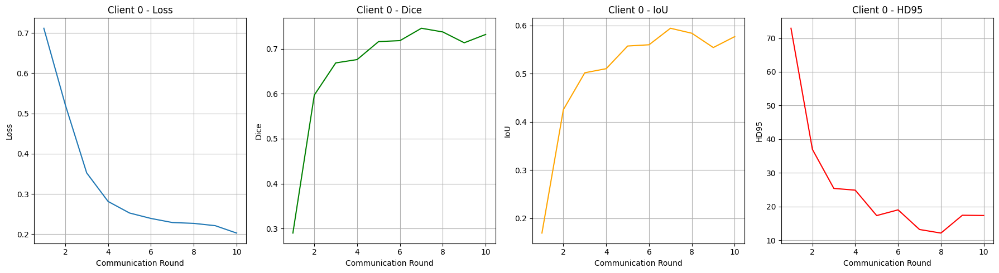

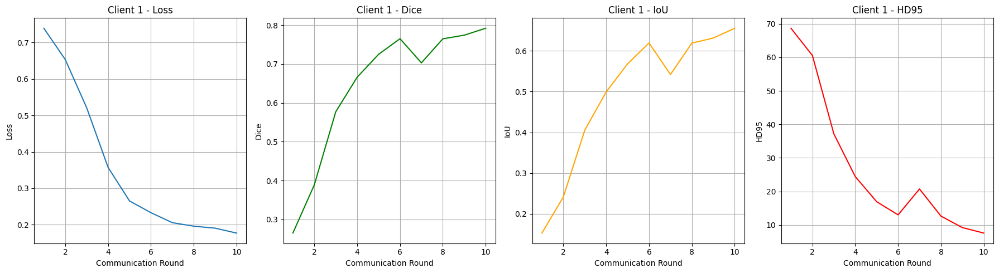

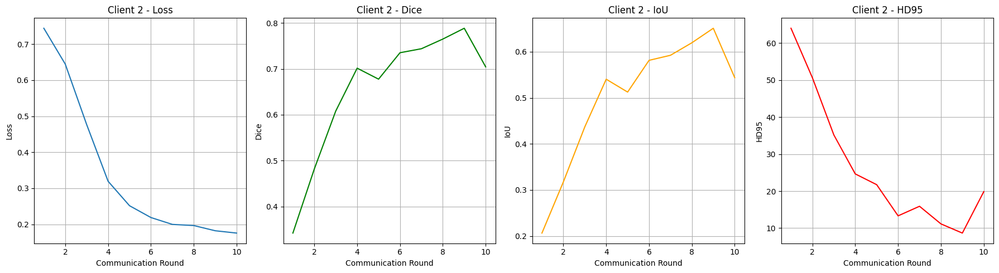

In [21]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

C:\Users\LAB.LAB12-PC14.000\AppData\Local\Temp\ipykernel_17204\3945427431.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


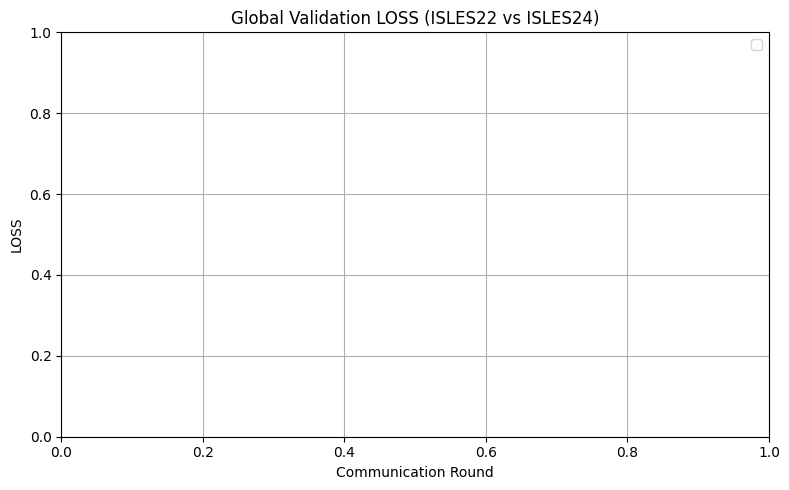

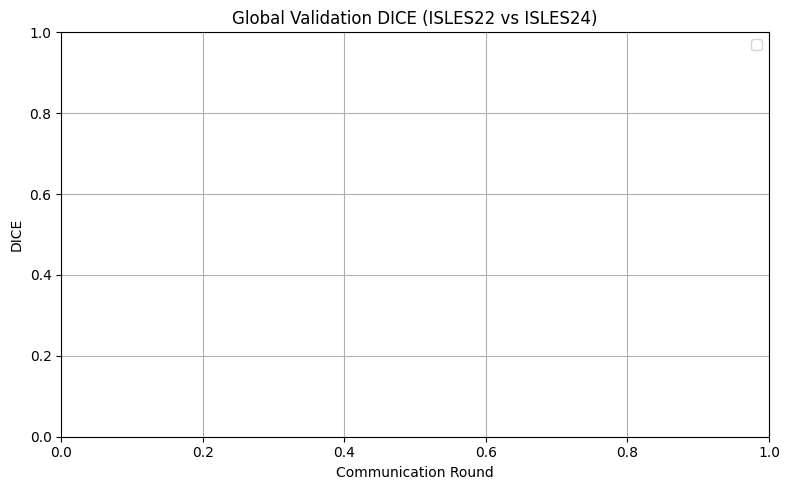

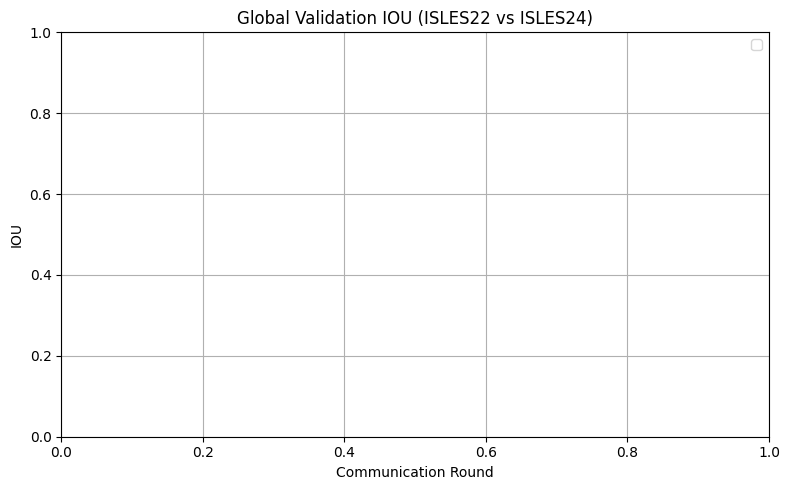

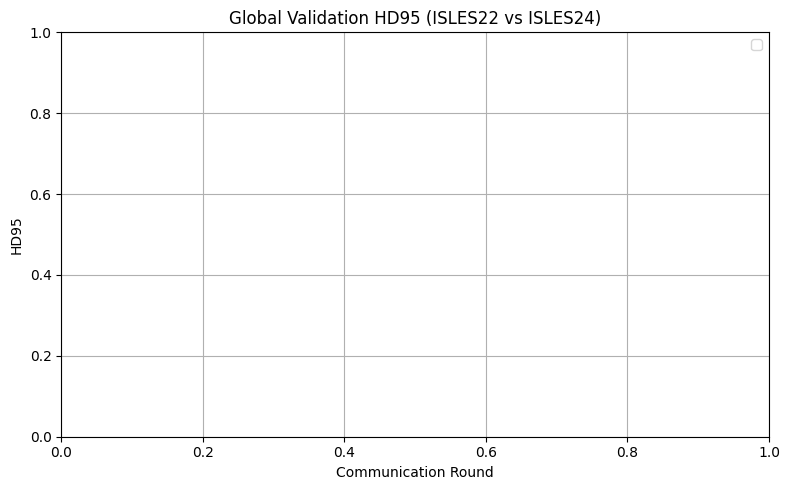

In [22]:
# -----------------------------
# Global Validation Curves
# ISLES22 vs ISLES24
# -----------------------------

metrics_to_plot = ["loss", "dice", "iou", "hd95"]

for metric in metrics_to_plot:

    plt.figure(figsize=(8, 5))

    for dataset_name, metrics in global_history.items():

        # safety check
        if metric not in metrics:
            continue

        rounds = range(1, len(metrics[metric]) + 1)

        plt.plot(
            rounds,
            metrics[metric],
            label=dataset_name
        )

    plt.xlabel("Communication Round")
    plt.ylabel(metric.upper())
    plt.title(f"Global Validation {metric.upper()} (ISLES22 vs ISLES24)")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

**Test Set and Segmentation**

In [23]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_sets = {
    "ISLES22": "D:/F25-156/Combined/ISLES22 Split 75 Preprocessed/test",
    "ISLES24": "D:/F25-156/Combined/ISLES24 Split 100 Preprocessed/test",
}
test_loaders = {}

for name, path in test_sets.items():

    test_dwi, test_masks = load_dwi_mask_pairs(path)

    test_dataset = ISLESDataset(
        dwi_files=test_dwi,
        mask_files=test_masks,
        transform=transform,
    )

    loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    test_loaders[name] = loader

    print(f"{name} test samples: {len(dataset)}")


ISLES22 test samples: 24
ISLES24 test samples: 24


In [24]:
def valuate_model(model, loader, device):

    model.eval()

    dice_metric = DiceMetric(include_background=False, reduction="mean")
    hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    with torch.no_grad():
        for batch in loader:

            images = batch["image"].to(device, dtype=torch.float32)
            masks = batch["mask"].to(device, dtype=torch.float32)

            outputs = model(images)
            preds = (torch.sigmoid(outputs) > 0.5).float()

            dice_metric(preds, masks)
            hd_metric(preds, masks)

    dice = dice_metric.aggregate().item()

    try:
        hd95 = hd_metric.aggregate().item()
    except:
        hd95 = float("nan")

    iou = dice / (2 - dice)

    return {
        "dice": dice,
        "iou": iou,
        "hd95": hd95
    }

In [25]:
client_test_results = {}

for client in clients:

    print(f"\n🔵 Testing Client {client.id}")

    # load personalized model
    ckpt = torch.load(f"best_client_{client.id}.pth")

    model = create_model().to(device)
    model.load_state_dict(ckpt["model_state_dict"])

    client_test_results[client.id] = {}

    for name, loader in test_loaders.items():

        metrics = valuate_model(model, loader, device)

        client_test_results[client.id][name] = metrics

        print(
            f"{name} TEST | "
            f"Dice={metrics['dice']:.4f} | "
            f"IoU={metrics['iou']:.4f} | "
            f"HD95={metrics['hd95']:.4f}"
        )
        
print("\n================ TEST RESULTS SUMMARY ================\n")

for cid, res in client_test_results.items():

    print(f"\nClient {cid}")

    for ds, m in res.items():
        print(
            f"{ds} TEST | "
            f"Dice={m['dice']:.4f} | "
            f"IoU={m['iou']:.4f} | "
            f"HD95={m['hd95']:.4f}"
        )


🔵 Testing Client 0
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm

C:\Users\LAB.LAB12-PC14.000\AppData\Local\Temp\ipykernel_17204\210704297.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(f"best_client_{client.id}.pth"

ISLES22 TEST | Dice=0.5870 | IoU=0.4154 | HD95=34.9993
ISLES24 TEST | Dice=0.5884 | IoU=0.4168 | HD95=20.5407

🔵 Testing Client 1
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
   

**Visualize**

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

C:\Users\LAB.LAB12-PC14.000\AppData\Local\Temp\ipykernel_17204\1565662979.py:46: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(f"best_client_{client.id}.pt

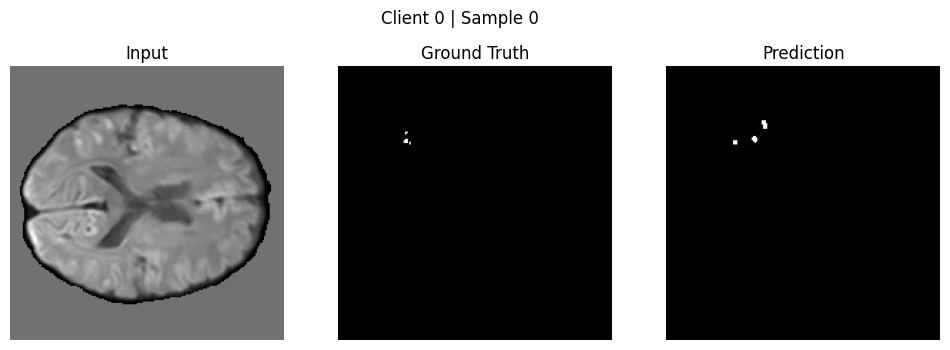

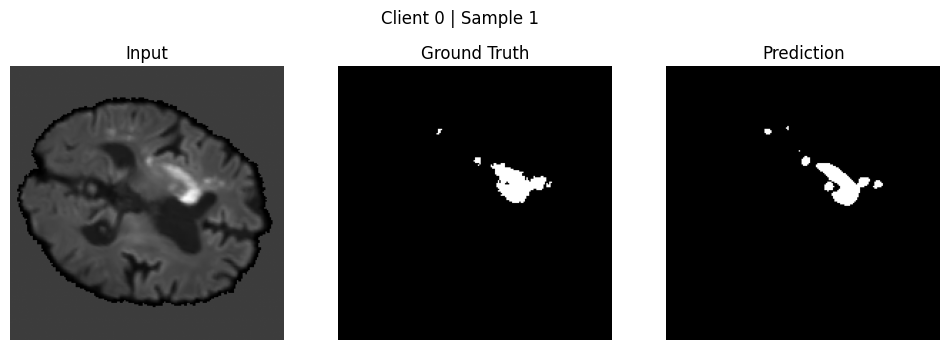

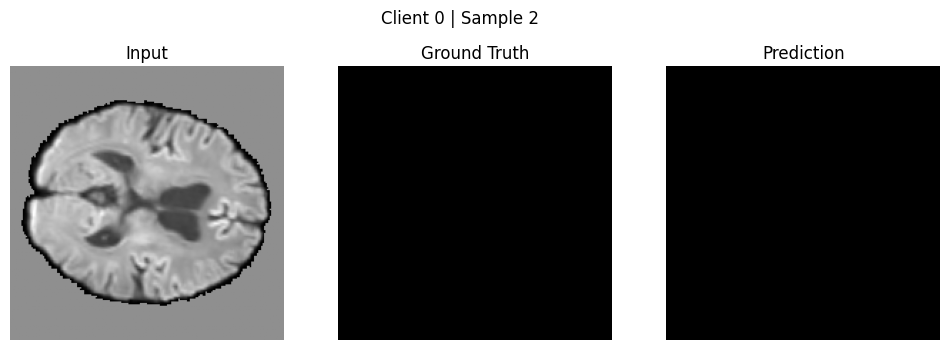

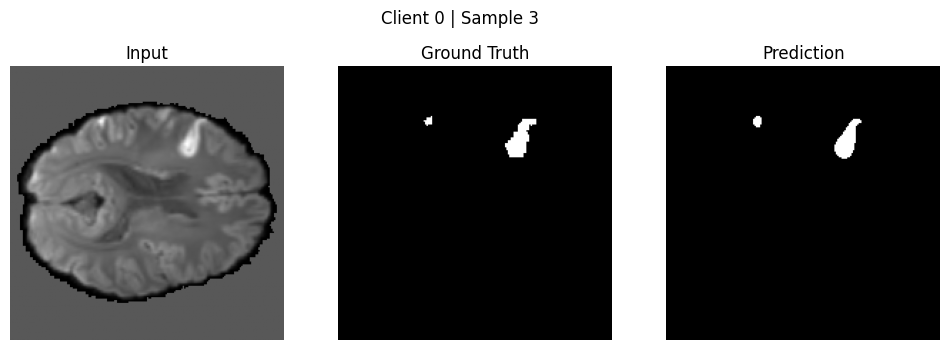

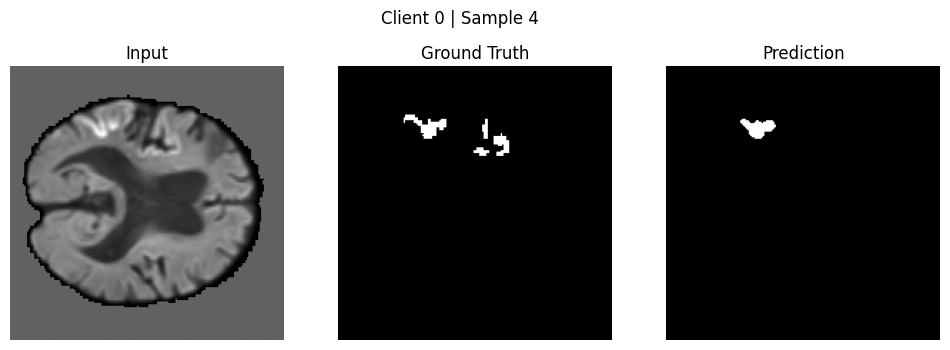

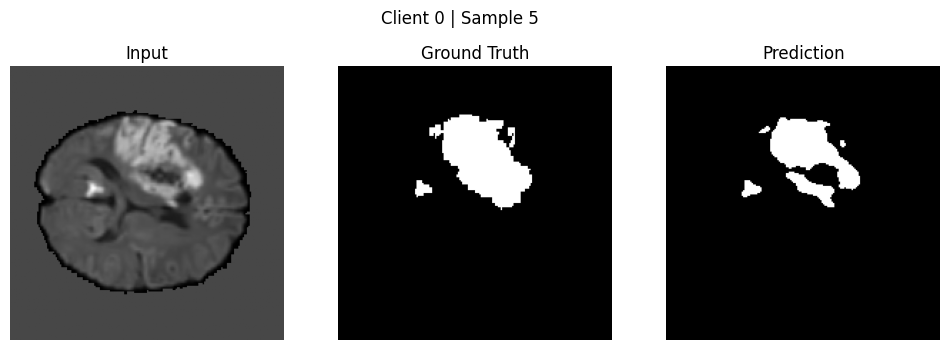

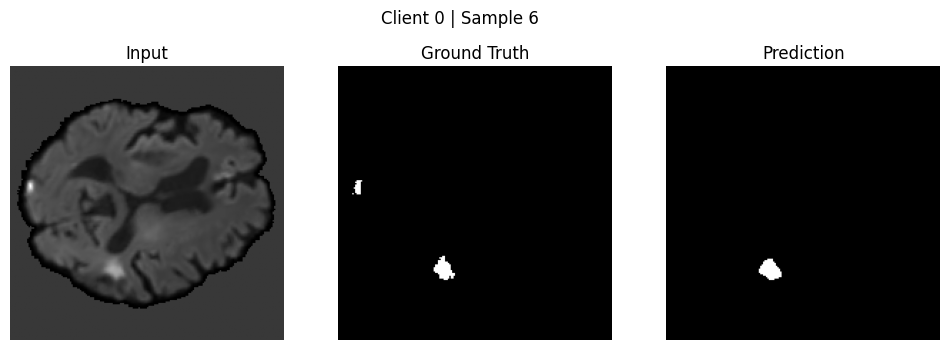

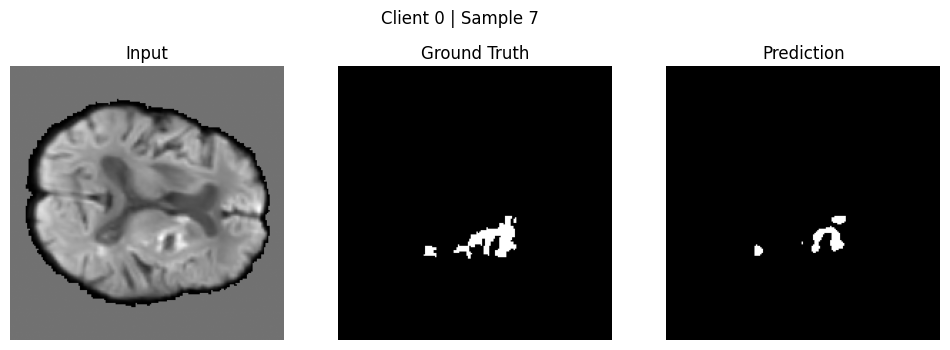

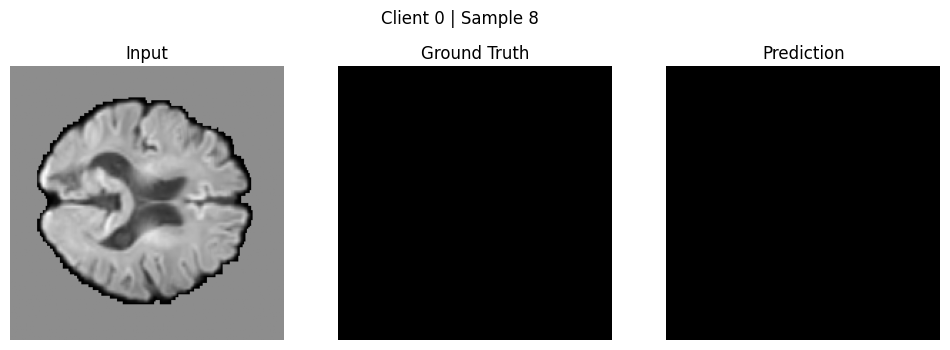

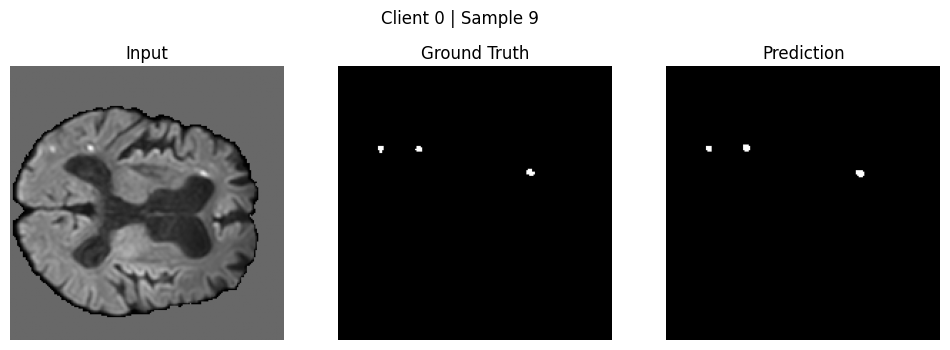

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

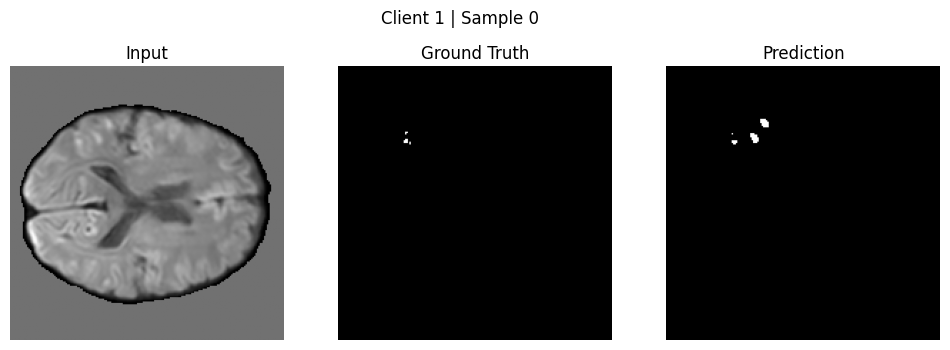

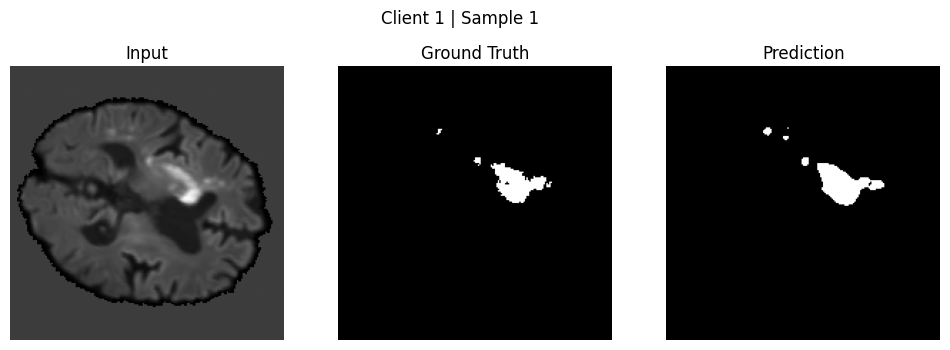

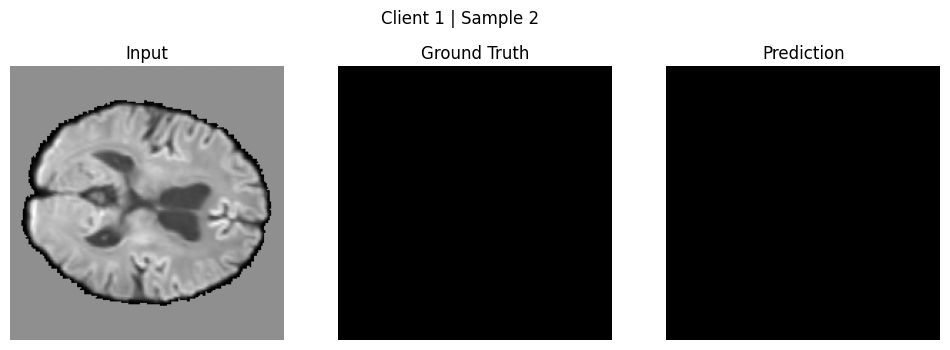

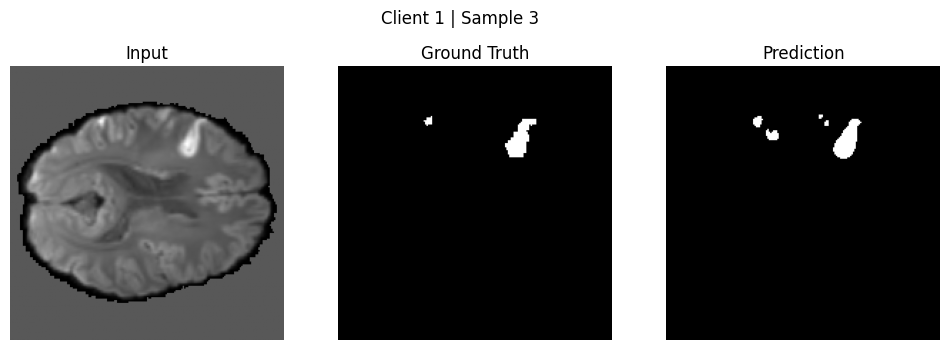

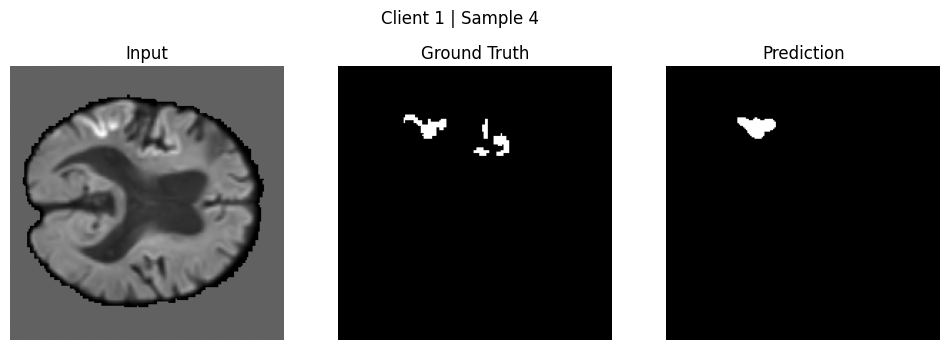

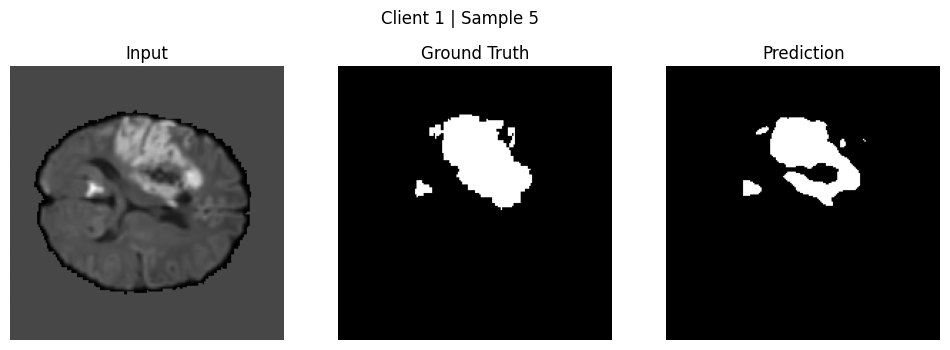

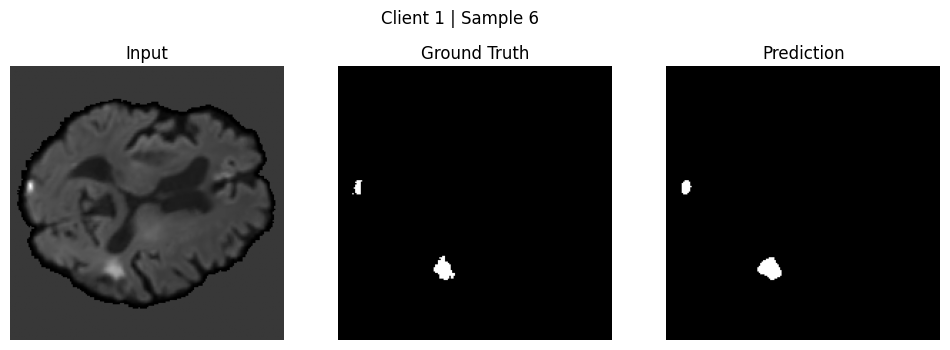

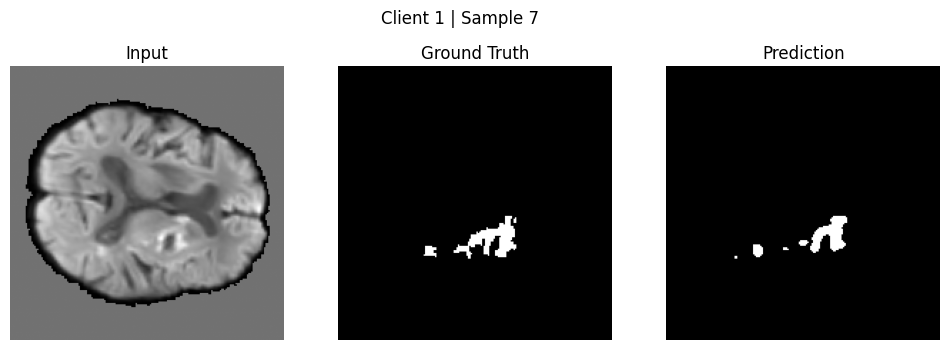

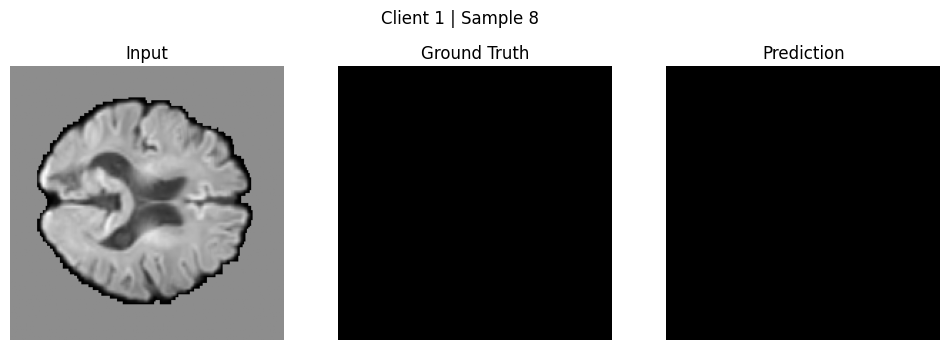

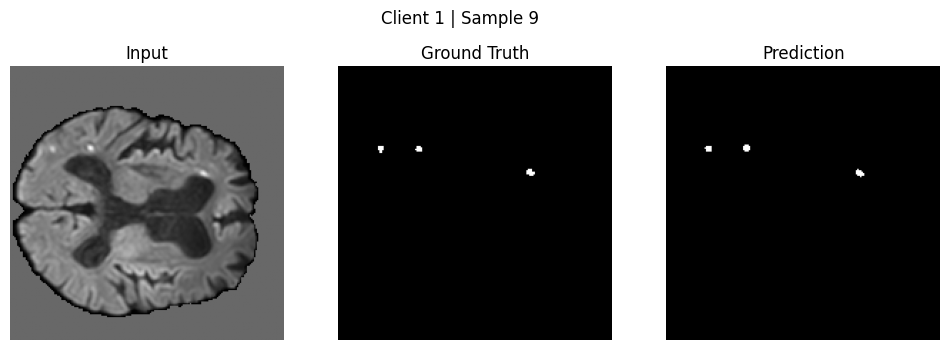

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

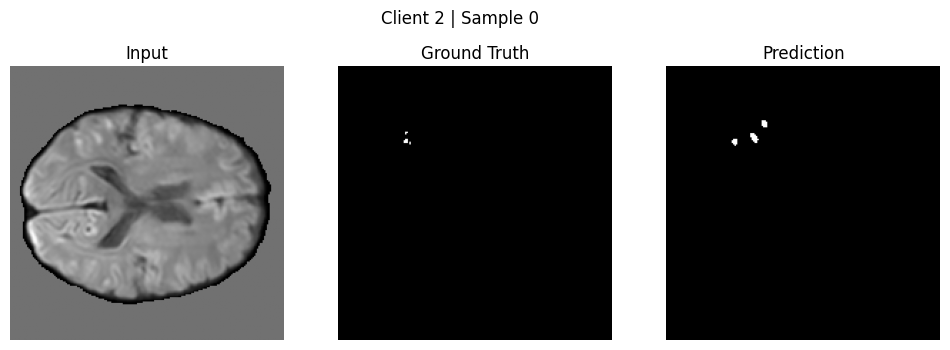

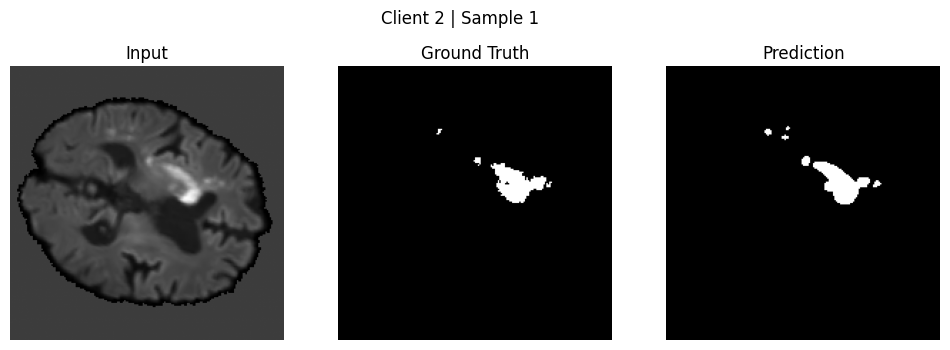

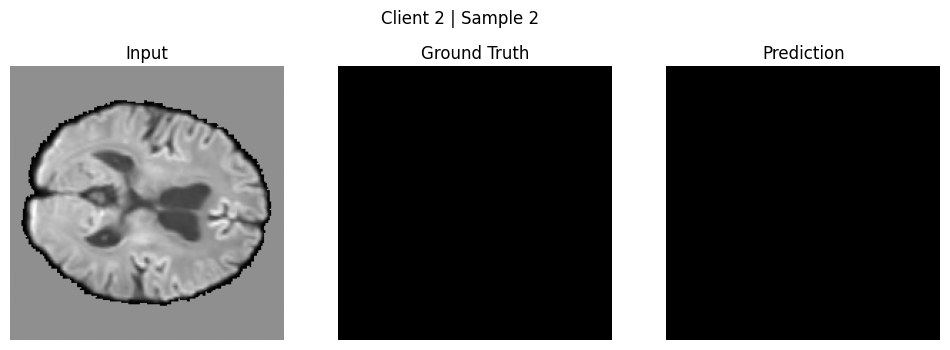

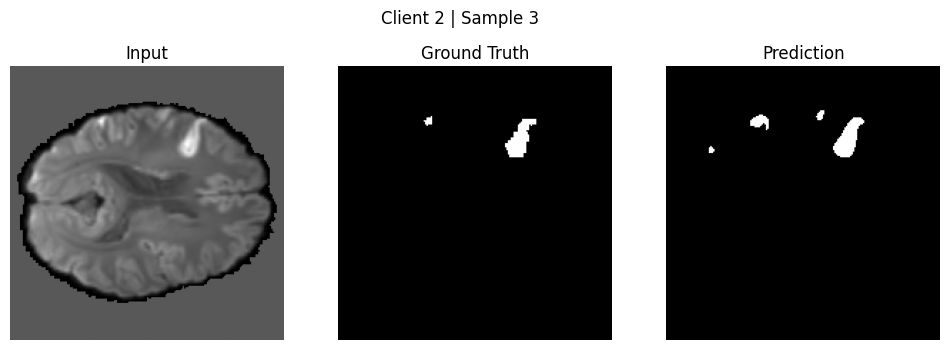

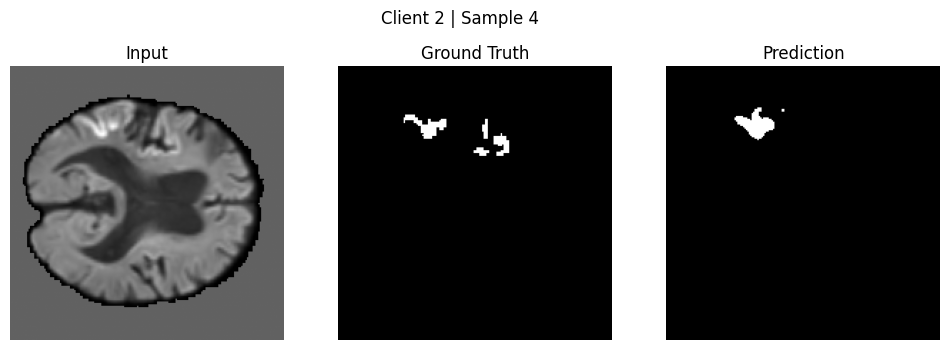

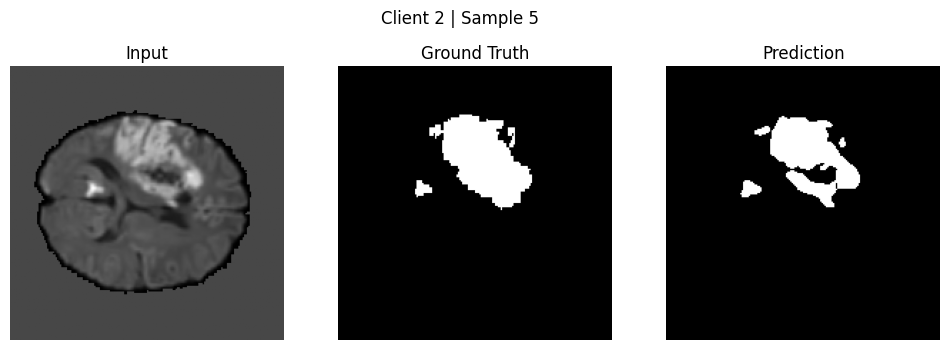

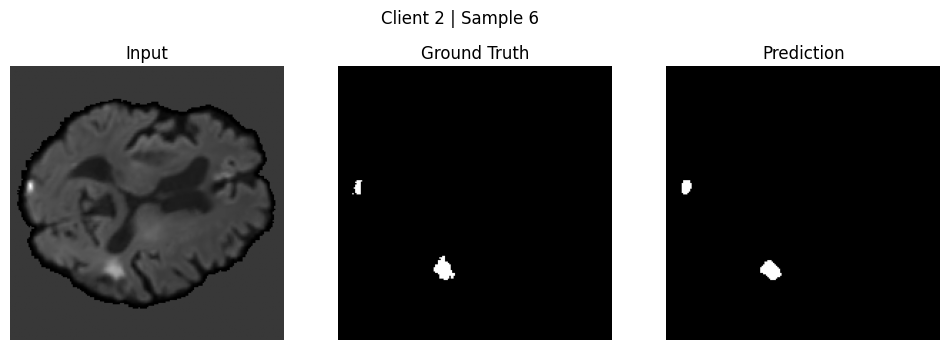

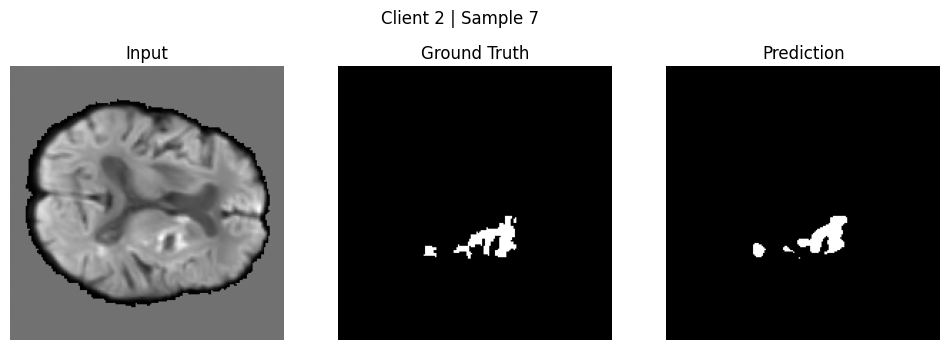

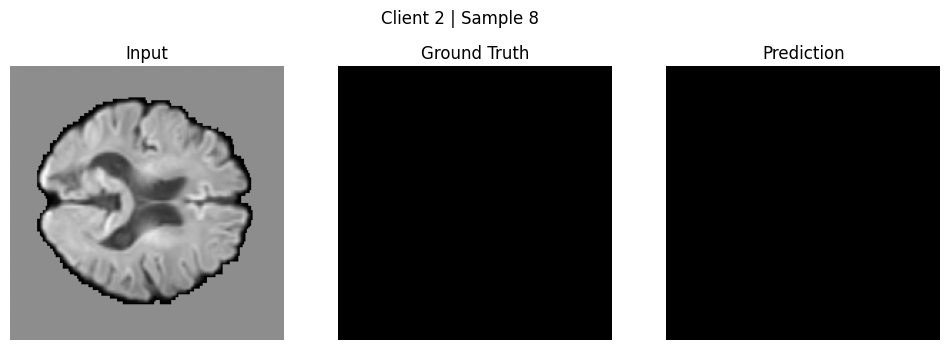

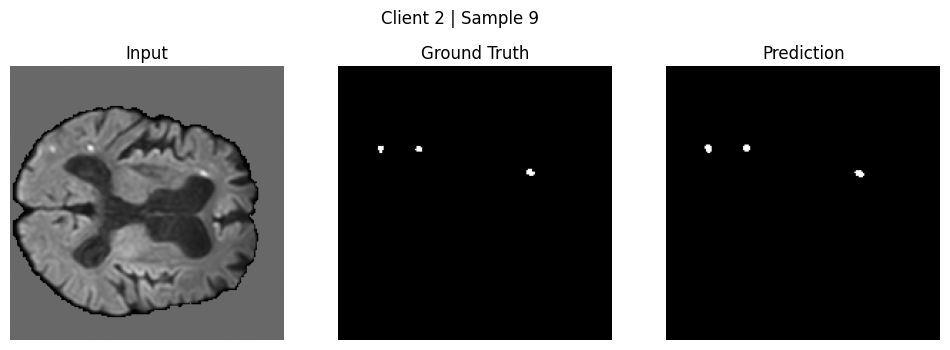

In [26]:
def visualize_model(model, dataset, device, client_id, num_samples=10):

    model.eval()

    for i in range(num_samples):

        sample = dataset[i]

        image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)

        image = sample["image"][0].cpu().numpy()
        mask  = sample["mask"][0].cpu().numpy()

        with torch.no_grad():
            output = model(image_tensor)
            pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

        mid = image.shape[2] // 2

        img_slice  = image[:, :, mid]
        mask_slice = mask[:, :, mid]
        pred_slice = pred[:, :, mid]

        plt.figure(figsize=(12,4))
        plt.suptitle(f"Client {client_id} | Sample {i}")

        plt.subplot(1,3,1)
        plt.imshow(img_slice, cmap="gray")
        plt.title("Input")
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(mask_slice, cmap="gray")
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(pred_slice, cmap="gray")
        plt.title("Prediction")
        plt.axis("off")

        plt.show()


for client in clients:
    ckpt = torch.load(f"best_client_{client.id}.pth")
    model = create_model().to(device)
    model.load_state_dict(ckpt["model_state_dict"])
    visualize_model(model, test_dataset, device, client.id, num_samples=10)

## Personalization

In [27]:
personalized_results = {}

for client in clients:

    print(f"\n🔵 Personalizing Client {client.id}")

    # ----------------------------------------
    # Load BEST saved model for this client
    # ----------------------------------------
    checkpoint = torch.load(
        f"best_client_{client.id}.pth",
        map_location=device
    )

    client.model.load_state_dict(checkpoint["model_state_dict"])

    print(
        f"Loaded best model for Client {client.id} "
        f"(Best Dice={checkpoint['dice']:.4f})"
    )

    # fine-tune locally (personalization)
    result = client.train_epochs_personalization(num_epochs=5)

    personalized_results[client.id] = result

    # save client model
    torch.save({
        "client_id": client.id,
        "model_state_dict": client.model.state_dict(),
        "personalized_metrics": result
    }, f"client_{client.id}_personalized.pth")

    print(f"Saved Client {client.id} personalized model")

    # -----------------------------
    # ✅ PRINT RESULTS
    # -----------------------------
    print(f"\n📊 Client {client.id} Personalization Results:")
    print(f"Loss : {result['loss']:.4f}")
    print(f"Dice : {result['dice']:.4f}")
    print(f"IoU  : {result['iou']:.4f}")
    print(f"HD95 : {result['hd95']:.4f}")
    print("-" * 50)


print("\n================ PERSONALIZATION SUMMARY ================\n")

for cid, r in personalized_results.items():
    print(
        f"Client {cid} | "
        f"Loss={r['loss']:.4f} | "
        f"Dice={r['dice']:.4f} | "
        f"IoU={r['iou']:.4f} | "
        f"HD95={r['hd95']:.4f}"
    )

C:\Users\LAB.LAB12-PC14.000\AppData\Local\Temp\ipykernel_17204\3046445156.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(



🔵 Personalizing Client 0
Loaded best model for Client 0 (Best Dice=0.6855)


Client 0 Epochs:  20%|██        | 1/5 [02:14<08:56, 134.13s/it]

Client 0 | Epoch 1/5 | Loss: 0.2149 | Dice: 0.7228 | IoU: 0.5659 | HD95: 17.6103


Client 0 Epochs:  40%|████      | 2/5 [04:26<06:39, 133.22s/it]

Client 0 | Epoch 2/5 | Loss: 0.1921 | Dice: 0.7549 | IoU: 0.6063 | HD95: 10.2419


Client 0 Epochs:  60%|██████    | 3/5 [06:41<04:28, 134.04s/it]

Client 0 | Epoch 3/5 | Loss: 0.2131 | Dice: 0.7249 | IoU: 0.5685 | HD95: 18.2363


Client 0 Epochs:  80%|████████  | 4/5 [08:55<02:13, 133.91s/it]

Client 0 | Epoch 4/5 | Loss: 0.1982 | Dice: 0.7461 | IoU: 0.5950 | HD95: 17.1069


Client 0 Epochs: 100%|██████████| 5/5 [11:08<00:00, 133.68s/it]


Client 0 | Epoch 5/5 | Loss: 0.1990 | Dice: 0.7455 | IoU: 0.5942 | HD95: 12.8597
Saved Client 0 personalized model

📊 Client 0 Personalization Results:
Loss : 0.2035
Dice : 0.7455
IoU  : 0.5942
HD95 : 12.8597
--------------------------------------------------

🔵 Personalizing Client 1
Loaded best model for Client 1 (Best Dice=0.6761)


Client 1 Epochs:  20%|██        | 1/5 [01:40<06:43, 100.82s/it]

Client 1 | Epoch 1/5 | Loss: 0.1952 | Dice: 0.7382 | IoU: 0.5850 | HD95: 16.6190


Client 1 Epochs:  40%|████      | 2/5 [03:19<04:57, 99.29s/it] 

Client 1 | Epoch 2/5 | Loss: 0.1809 | Dice: 0.7591 | IoU: 0.6117 | HD95: 10.3317


Client 1 Epochs:  60%|██████    | 3/5 [04:57<03:18, 99.06s/it]

Client 1 | Epoch 3/5 | Loss: 0.1734 | Dice: 0.7692 | IoU: 0.6249 | HD95: 14.2463


Client 1 Epochs:  80%|████████  | 4/5 [06:35<01:38, 98.70s/it]

Client 1 | Epoch 4/5 | Loss: 0.1766 | Dice: 0.7649 | IoU: 0.6193 | HD95: 11.1935


Client 1 Epochs: 100%|██████████| 5/5 [08:14<00:00, 98.88s/it]


Client 1 | Epoch 5/5 | Loss: 0.1665 | Dice: 0.7793 | IoU: 0.6384 | HD95: 11.6309
Saved Client 1 personalized model

📊 Client 1 Personalization Results:
Loss : 0.1785
Dice : 0.7793
IoU  : 0.6384
HD95 : 11.6309
--------------------------------------------------

🔵 Personalizing Client 2
Loaded best model for Client 2 (Best Dice=0.6738)


Client 2 Epochs:  20%|██        | 1/5 [01:43<06:53, 103.32s/it]

Client 2 | Epoch 1/5 | Loss: 0.1783 | Dice: 0.7543 | IoU: 0.6055 | HD95: 12.9273


Client 2 Epochs:  40%|████      | 2/5 [03:24<05:06, 102.29s/it]

Client 2 | Epoch 2/5 | Loss: 0.2124 | Dice: 0.7073 | IoU: 0.5472 | HD95: 21.6921


Client 2 Epochs:  60%|██████    | 3/5 [05:06<03:23, 101.96s/it]

Client 2 | Epoch 3/5 | Loss: 0.2300 | Dice: 0.6809 | IoU: 0.5162 | HD95: 21.8348


Client 2 Epochs:  80%|████████  | 4/5 [06:47<01:41, 101.65s/it]

Client 2 | Epoch 4/5 | Loss: 0.2010 | Dice: 0.7207 | IoU: 0.5634 | HD95: 16.1566


Client 2 Epochs: 100%|██████████| 5/5 [08:28<00:00, 101.64s/it]

Client 2 | Epoch 5/5 | Loss: 0.1795 | Dice: 0.7526 | IoU: 0.6033 | HD95: 14.5107
Saved Client 2 personalized model

📊 Client 2 Personalization Results:
Loss : 0.2002
Dice : 0.7526
IoU  : 0.6033
HD95 : 14.5107
--------------------------------------------------

================ PERSONALIZATION SUMMARY ================

Client 0 | Loss=0.2035 | Dice=0.7455 | IoU=0.5942 | HD95=12.8597
Client 1 | Loss=0.1785 | Dice=0.7793 | IoU=0.6384 | HD95=11.6309
Client 2 | Loss=0.2002 | Dice=0.7526 | IoU=0.6033 | HD95=14.5107


Validation

In [28]:
client_val_results = {}

for client in clients:

    print(f"\n🟡 Validating Client {client.id}")

    # load personalized model
    ckpt = torch.load(f"client_{client.id}_personalized.pth")

    model = create_model().to(device)
    model.load_state_dict(ckpt["model_state_dict"])

    client_val_results[client.id] = {}

    for name, loader in val_loaders.items():

        metrics = valuate_model(model, loader, device)

        client_val_results[client.id][name] = metrics

        print(
            f"{name} VAL | "
            f"Dice={metrics['dice']:.4f} | "
            f"IoU={metrics['iou']:.4f} | "
            f"HD95={metrics['hd95']:.4f}"
        )
        
print("\n================ VALIDATION SUMMARY ================\n")

for cid, res in client_val_results.items():

    print(f"\nClient {cid}")

    for ds, m in res.items():
        print(
            f"{ds} | "
            f"Dice={m['dice']:.4f} | "
            f"IoU={m['iou']:.4f} | "
            f"HD95={m['hd95']:.4f}"
        )


🟡 Validating Client 0
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupN

C:\Users\LAB.LAB12-PC14.000\AppData\Local\Temp\ipykernel_17204\2214001518.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(f"client_{client.id}_personal

ISLES22 VAL | Dice=0.6301 | IoU=0.4600 | HD95=32.4872
ISLES24 VAL | Dice=0.7199 | IoU=0.5623 | HD95=12.8392

🟡 Validating Client 1
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
  

c:\Users\LAB.LAB12-PC14.000\AppData\Local\Programs\Python\Python311\Lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(


ISLES22 VAL | Dice=0.6836 | IoU=0.5193 | HD95=16.5790
ISLES24 VAL | Dice=0.5485 | IoU=0.3779 | HD95=26.2635

🟡 Validating Client 2
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
  

Testing

In [29]:
client_test_results = {}

for client in clients:

    print(f"\n🔵 Testing Client {client.id}")

    # load personalized model
    ckpt = torch.load(f"client_{client.id}_personalized.pth")

    model = create_model().to(device)
    model.load_state_dict(ckpt["model_state_dict"])

    client_test_results[client.id] = {}

    for name, loader in test_loaders.items():

        metrics = valuate_model(model, loader, device)

        client_test_results[client.id][name] = metrics

        print(
            f"{name} TEST | "
            f"Dice={metrics['dice']:.4f} | "
            f"IoU={metrics['iou']:.4f} | "
            f"HD95={metrics['hd95']:.4f}"
        )
        
print("\n================ TEST RESULTS SUMMARY ================\n")

for cid, res in client_test_results.items():

    print(f"\nClient {cid}")

    for ds, m in res.items():
        print(
            f"{ds} TEST | "
            f"Dice={m['dice']:.4f} | "
            f"IoU={m['iou']:.4f} | "
            f"HD95={m['hd95']:.4f}"
        )


🔵 Testing Client 0
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm

C:\Users\LAB.LAB12-PC14.000\AppData\Local\Temp\ipykernel_17204\669573348.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(f"client_{client.id}_personali

ISLES22 TEST | Dice=0.5928 | IoU=0.4213 | HD95=29.2371
ISLES24 TEST | Dice=0.6516 | IoU=0.4833 | HD95=17.6038

🔵 Testing Client 1
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
   